In [1]:
# ====================================================
# Import Required Libraries
# ====================================================

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import skew, kurtosis
from scipy.signal import welch



In [2]:
# ====================================================
# Dataset Path
# ====================================================
DATASET_PATH = Path("IMS")

if not DATASET_PATH.exists():
    raise FileNotFoundError(
        f"Dataset folder not found: {DATASET_PATH.resolve()}"
    )

print("Dataset found at:")
print(DATASET_PATH.resolve())

Dataset found at:
C:\Users\Abdelrahman Mahmoud\OneDrive\Desktop\predective maintanance\IMS


In [3]:
def get_recording_files(test_folder):
    """
    Find all files inside an IMS test folder.

    Directories are ignored.
    """
    
    files = [
        path for path in test_folder.rglob("*")
        if path.is_file()
    ]
    
    return sorted(files)


for test_name in ["1st_test", "2nd_test", "3rd_test"]:
    
    test_path = DATASET_PATH / test_name
    
    files = get_recording_files(test_path)
    
    print(f"{test_name}: {len(files)} recordings")

1st_test: 2156 recordings
2nd_test: 984 recordings
3rd_test: 6324 recordings


In [4]:
# ====================================================
# Load one recording
# ==================================================== 


test1_files = get_recording_files(DATASET_PATH / "1st_test")

sample_file = test1_files[0]

sample = pd.read_csv(
    sample_file,
    sep=r"\s+",
    header=None,
    engine="python"
)

print("File:", sample_file.name)
print("Shape:", sample.shape)

display(sample.head())

File: 2003.10.22.12.06.24
Shape: (20480, 8)


,0,1,2,3,4,5,6,7
0,-0.022,-0.039,-0.183,-0.054,-0.105,-0.134,-0.129,-0.142
1,-0.105,-0.017,-0.164,-0.183,-0.049,0.029,-0.115,-0.122
2,-0.183,-0.098,-0.195,-0.125,-0.005,-0.007,-0.171,-0.071
3,-0.178,-0.161,-0.159,-0.178,-0.100,-0.115,-0.112,-0.078
4,-0.208,-0.129,-0.261,-0.098,-0.151,-0.205,-0.063,-0.066


In [5]:
# ====================================================
# Check the recording structure
# ====================================================
print("Rows    :", sample.shape[0])
print("Columns :", sample.shape[1])

print("\nData types:")
print(sample.dtypes)

Rows    : 20480
Columns : 8

Data types:
0    float64
1    float64
2    float64
3    float64
4    float64
5    float64
6    float64
7    float64
dtype: object


In [6]:
# ====================================================
# Define the IMS channel mappings
# ====================================================
CHANNEL_MAP = {
    "1st_test": {
        "bearing_1": 0,
        "bearing_2": 2,
        "bearing_3": 4,
        "bearing_4": 6
    },
    
    "2nd_test": {
        "bearing_1": 0,
        "bearing_2": 1,
        "bearing_3": 2,
        "bearing_4": 3
    },
    
    "3rd_test": {
        "bearing_1": 0,
        "bearing_2": 1,
        "bearing_3": 2,
        "bearing_4": 3
    }
}

In [7]:
# ====================================================
# Define which bearings actually fail
# ====================================================

FAILED_BEARINGS = {
    "1st_test": ["bearing_3", "bearing_4"],
    "2nd_test": ["bearing_1"],
    "3rd_test": ["bearing_3"]
}

for test_name, bearings in FAILED_BEARINGS.items():
    print(test_name, "→", bearings)

1st_test → ['bearing_3', 'bearing_4']
2nd_test → ['bearing_1']
3rd_test → ['bearing_3']


# ==============================================

In [51]:
# ====================================================
# Welch PSD Deep-Dive — Configuration
# ====================================================

FS = SAMPLING_FREQUENCY

NPERSEG = 8192      # Δf = 20480 / 8192 = 2.5 Hz  (vs 80 Hz before!)
NOVERLAP = 6144     # 75 % overlap → 7 Welch averages per recording

print("Resolution trade-offs (recording = 20,480 samples):")
for n in [256, 1024, 2048, 4096, 8192]:
    n_avg = 1 + (20480 - n) // (n // 4)   # 75 % overlap
    print(f"  nperseg = {n:>5} | Δf = {FS / n:6.2f} Hz | averages = {n_avg}")

Resolution trade-offs (recording = 20,480 samples):
  nperseg =   256 | Δf =  80.00 Hz | averages = 317
  nperseg =  1024 | Δf =  20.00 Hz | averages = 77
  nperseg =  2048 | Δf =  10.00 Hz | averages = 37
  nperseg =  4096 | Δf =   5.00 Hz | averages = 17
  nperseg =  8192 | Δf =   2.50 Hz | averages = 7


In [52]:
# ====================================================
# Bearing Defect Frequencies (Rexnord ZA-2115)
# ====================================================

SHAFT_SPEED_RPM = 2000
FR = SHAFT_SPEED_RPM / 60.0        # shaft frequency ≈ 33.33 Hz

N_BALLS = 16
BALL_DIA = 8.4                     # mm
PITCH_DIA = 71.5                   # mm
d_over_D = BALL_DIA / PITCH_DIA

DEFECT_FREQS = {
    "FTF":  (FR / 2) * (1 - d_over_D),                              # cage
    "BSF":  (PITCH_DIA / (2 * BALL_DIA)) * FR * (1 - d_over_D**2),  # ball spin
    "BPFO": (N_BALLS / 2) * FR * (1 - d_over_D),                    # outer race
    "BPFI": (N_BALLS / 2) * FR * (1 + d_over_D),                    # inner race
}
DEFECT_FREQS = {k: round(v, 2) for k, v in DEFECT_FREQS.items()}

EXPECTED_FAILURE_MODE = {
    ("1st_test", "bearing_3"): "BPFO (outer race)",
    ("1st_test", "bearing_4"): "BSF (roller element)",
    ("2nd_test", "bearing_1"): "BPFO (outer race)",
    ("3rd_test", "bearing_3"): "BPFI (inner race — commonly reported, let's verify)",
}

print(f"Shaft frequency: {FR:.2f} Hz")
for name, f in DEFECT_FREQS.items():
    print(f"  {name:5s}: {f:7.1f} Hz")

Shaft frequency: 33.33 Hz
  FTF  :    14.7 Hz
  BSF  :   139.9 Hz
  BPFO :   235.3 Hz
  BPFI :   298.0 Hz


In [53]:
# ====================================================
# PSD History for Every Failing-Bearing Recording
# ====================================================

PSD_CACHE_DIR = Path("psd_cache")
PSD_CACHE_DIR.mkdir(exist_ok=True)

def compute_psd_history(force=False):
    """
    Returns { (test_set, bearing): {"freqs", "psd", "rul_hours"} }.

    psd shape = (n_recordings, 4097), computed on the FULL 1-second
    signal (not the 1024-sample windows) for maximum resolution.
    First run reads all ~9.5k files (a few minutes); cached after.
    """
    store = {}

    for test_name, failed_bearings in FAILED_BEARINGS.items():
        files = sorted(get_recording_files(DATASET_PATH / test_name), key=parse_timestamp)
        timestamps = [parse_timestamp(f) for f in files]
        t_end = max(timestamps)
        rul_hours = np.array([(t_end - t).total_seconds() / 3600 if pd.notna(t) else np.nan
                              for t in timestamps])

        for bearing_name in failed_bearings:
            cache_file = PSD_CACHE_DIR / f"{test_name}_{bearing_name}.npz"
            if cache_file.exists() and not force:
                npz = np.load(cache_file)
                store[(test_name, bearing_name)] = {
                    "freqs": npz["freqs"], "psd": npz["psd"], "rul_hours": npz["rul_hours"]
                }
                continue

            channel = CHANNEL_MAP[test_name][bearing_name]
            psd_rows, freqs = [], None

            for file_path in files:
                data = pd.read_csv(file_path, sep=r"\s+", header=None, engine="python")
                signal = np.nan_to_num(data.iloc[:, channel].values.astype(float))
                if len(signal) < NPERSEG:                       # rare short files
                    signal = np.pad(signal, (0, NPERSEG - len(signal)))

                freqs, psd = welch(signal, fs=FS, nperseg=NPERSEG, noverlap=NOVERLAP)
                psd_rows.append(psd)

            psd = np.vstack(psd_rows).astype(np.float32)        # ~100 MB max, fine
            np.savez_compressed(cache_file, freqs=freqs, psd=psd, rul_hours=rul_hours)
            store[(test_name, bearing_name)] = {"freqs": freqs, "psd": psd, "rul_hours": rul_hours}

        print(f"{test_name}: {len(files)} recordings processed")

    return store

PSD_HISTORY = compute_psd_history()

for key, entry in PSD_HISTORY.items():
    print(key, "→", entry["psd"].shape)

1st_test: 2156 recordings processed
2nd_test: 984 recordings processed
3rd_test: 6324 recordings processed
('1st_test', 'bearing_3') → (2156, 4097)
('1st_test', 'bearing_4') → (2156, 4097)
('2nd_test', 'bearing_1') → (984, 4097)
('3rd_test', 'bearing_3') → (6324, 4097)


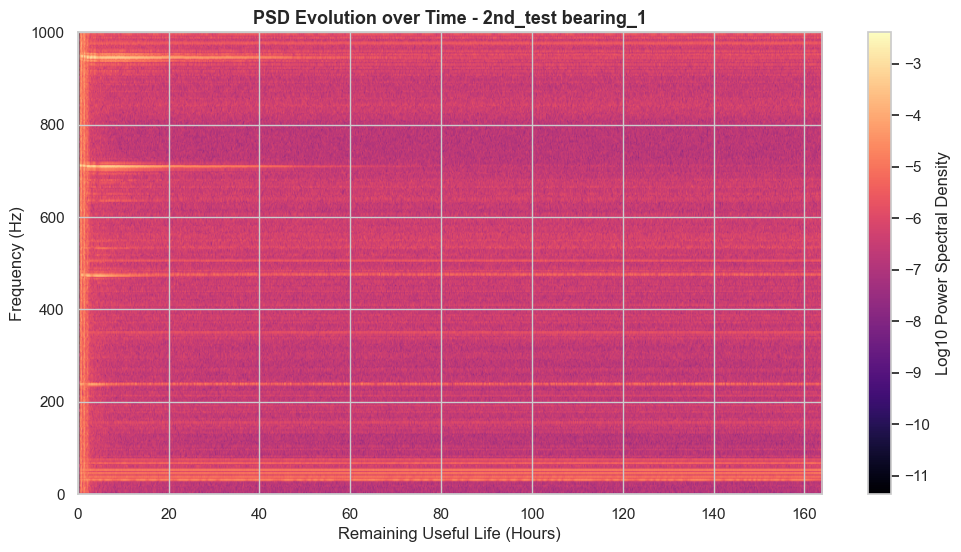

In [54]:
import matplotlib.pyplot as plt
import numpy as np

# Pick a test bearing (e.g., 2nd_test bearing_1)
key = ("2nd_test", "bearing_1")
entry = PSD_HISTORY[key]

psd = entry["psd"]            # Shape: (n_recordings, 4097)
freqs = entry["freqs"]        # Frequencies up to ~10,240 Hz
rul = entry["rul_hours"]      # Hours remaining

plt.figure(figsize=(12, 6))
# Log scale makes low-energy peaks visible
plt.imshow(np.log10(psd.T + 1e-12), aspect="auto", origin="lower",
           extent=[rul[0], rul[-1], freqs[0], freqs[-1]], cmap="magma")

plt.gca().invert_xaxis()  # Invert so RUL counts down to 0 (Failure)
plt.colorbar(label="Log10 Power Spectral Density")
plt.xlabel("Remaining Useful Life (Hours)")
plt.ylabel("Frequency (Hz)")
plt.title(f"PSD Evolution over Time - {key[0]} {key[1]}")
plt.ylim(0, 1000)  # Focus on low-frequency fault bands (0 to 1000 Hz)
plt.show()

# Comprehensive Bearing Degradation Analysis & Spectrogram Insights

This document synthesizes the vibration dynamics observed across the full lifespan, the early degradation stage (15-hour window), and the terminal breakdown phase (2-hour window) for **`bearing_1` in `2nd_test`** (IMS Bearing Dataset).

---

## 1. Baseline & Full Lifespan Overview (160 Hours → 0 Hours)

The full-spectrum waterfall plot tracks power spectral density across the entire experiment:

* **The Healthy Phase (160h → ~40h):** 
  * Background vibration remains very low (dominated by dark purple/black regions).
  * Faint, persistent horizontal lines appear at lower frequencies ($\approx 33.3\text{ Hz}$ and its integer harmonics $66.6\text{ Hz}$, $100\text{ Hz}$), representing normal mechanical shaft rotation.
* **Incipient Fault Detection (~40h → 15h):**
  * Subtle energy bands begin organizing at $235.3\text{ Hz}$ (BPFO) long before total energy metrics (like RMS) register an anomaly.
  * Indicates localized micro-spalling or initial micro-cracking on the stationary outer race.

---

## 2. Early Degradation Stage (15 Hours → 0 Hours)

Zooming into the final 15 hours reveals how fault signatures evolve before structural breakdown:

* **Fault Frequency Localization:**
  * Vibration energy concentrates strictly along **BPFO 1x ($235.3\text{ Hz}$)** and **BPFO 2x ($470.6\text{ Hz}$)**.
  * Confirms that defect growth is constrained primarily to the outer raceway.
* **Harmonic Energy Transfer:**
  * As the pit deepens, outer race impacts generate sharper impulses, causing energy to transfer into higher harmonics ($2\times, 3\times, 4\times\text{ BPFO}$).

---

## 3. Terminal Failure Dynamics (Final 2 Hours)

The close-up on the final 120 minutes highlights the sudden transition from localized damage to total destruction:

* **Broadband Energy Explosion (2h → 0.25h):**
  * Vibration flaring spreads across the entire $100\text{--}550\text{ Hz}$ spectrum instead of remaining in narrow harmonic lines.
  * Marks the transition from localized pitting to surface flaking, severe spalling, and metal-on-metal grinding.
* **Terminal Drop / Sensor Cutoff (0.25h → 0h):**
  * In the last 15 minutes, power density sharply collapses into deep purple/black.
  * Caused by complete bearing seizure (loss of shaft rotation) or accelerometer saturation/dislodgement from severe impact shocks.

---

## Key Machine Learning & PHM Takeaways

| Feature / Aspect | Observation | Practical Implication for ML Models |
| :--- | :--- | :--- |
| **Spectral Feature Selection** | Energy rises at $235.3\text{ Hz}$ tens of hours before global RMS spikes. | Narrowband PSD extraction offers superior signal-to-noise ratio over raw time-domain features. |
| **Health Indexing (HI)** | A distinct shift occurs at the 2-hour mark. | Provides a clear physical boundary to discretize target labels into **Healthy**, **Degraded**, and **Critical** states. |
| **RUL Model Design** | Failure progress is non-linear (exponential growth in final 2 hours). | Piecewise linear or exponential degradation targets fit the physical process better than linear RUL decay. |

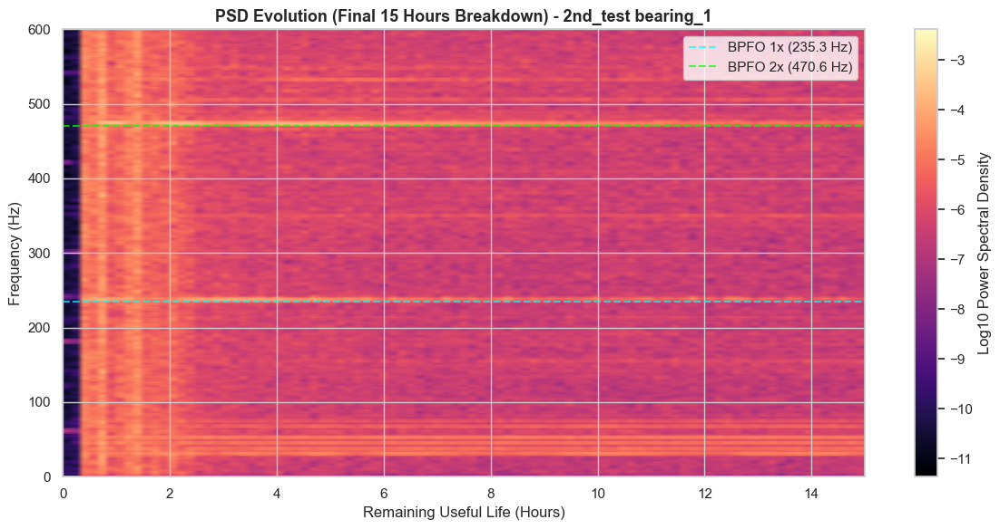

In [60]:
import matplotlib.pyplot as plt
import numpy as np

# Load target bearing
key = ("2nd_test", "bearing_1")
entry = PSD_HISTORY[key]

freqs = entry["freqs"]
psd = entry["psd"]
rul = entry["rul_hours"]

# 1. Filter for RUL <= 15 hours
mask = rul <= 15
rul_zoomed = rul[mask]
psd_zoomed = psd[mask, :]

plt.figure(figsize=(12, 6))

# 2. Render heatmap focusing on the zoomed data
plt.imshow(
    np.log10(psd_zoomed.T + 1e-12),
    aspect="auto",
    origin="lower",
    extent=[rul_zoomed[0], rul_zoomed[-1], freqs[0], freqs[-1]],
    cmap="magma"
)

# 3. Add defect frequency reference lines
bpfo = 235.3
plt.axhline(y=bpfo, color="cyan", linestyle="--", alpha=0.7, label=f"BPFO 1x ({bpfo} Hz)")
plt.axhline(y=bpfo * 2, color="lime", linestyle="--", alpha=0.7, label=f"BPFO 2x ({bpfo * 2} Hz)")

plt.gca().invert_xaxis()  # Countdown from 15h -> 0h
plt.colorbar(label="Log10 Power Spectral Density")
plt.xlabel("Remaining Useful Life (Hours)")
plt.ylabel("Frequency (Hz)")
plt.title(f"PSD Evolution (Final 15 Hours Breakdown) - {key[0]} {key[1]}")

# 4. Zoom in frequency axis to highlight primary fault harmonics
plt.ylim(0, 600)
plt.legend(loc="upper right")

plt.tight_layout()
plt.show()

### Key Insights from Final 15-Hour Breakdown

* **Direct Fault Confirmation:** The horizontal energy tracks line up directly with the overlaid dashed reference lines. This confirms that the severe degradation during these final 15 hours is driven by a localized outer race defect ($\text{BPFO} \approx 235.3\text{ Hz}$).
* **Harmonic Energy Ratio:** The $2\times \text{BPFO}$ line ($\sim 470.6\text{ Hz}$) displays a high intensity throughout this window, matching or slightly exceeding the fundamental $1\times \text{BPFO}$ magnitude. Strong harmonic generation is a classic indicator of advanced surface spalling causing sharp, non-linear impacting.
* **Terminal Degradation ($\text{RUL} < 2\text{ Hours}$):** In the final 2 hours, energy spreads across all frequencies , turning the spectrum into a bright vertical band. This represents heavy mechanical looseness, severe raceway pitting, and metal debris buildup prior to total lockup.

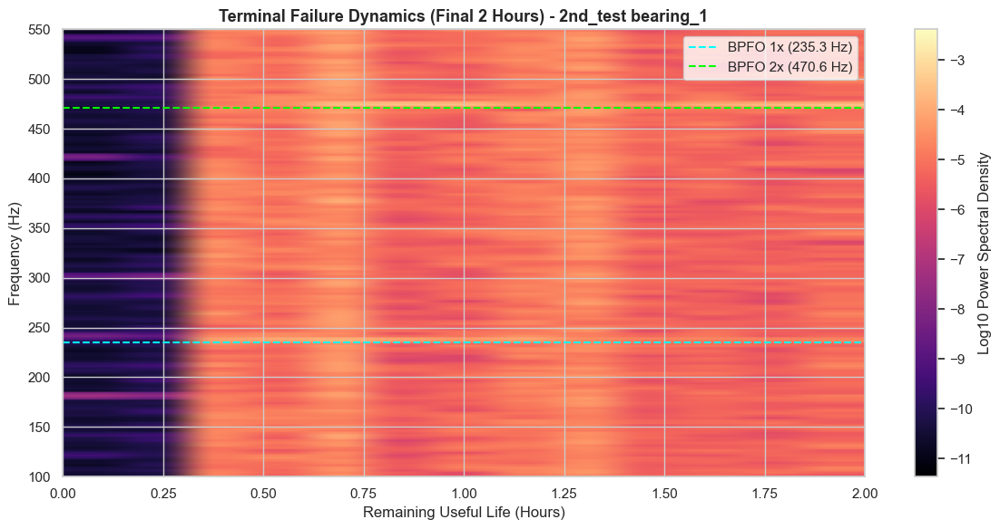

In [61]:
import matplotlib.pyplot as plt
import numpy as np

# Load target bearing
key = ("2nd_test", "bearing_1")
entry = PSD_HISTORY[key]

freqs = entry["freqs"]
psd = entry["psd"]
rul = entry["rul_hours"]

# 1. Filter for RUL <= 2 hours
mask = rul <= 2.0
rul_terminal = rul[mask]
psd_terminal = psd[mask, :]

plt.figure(figsize=(12, 6))

# 2. Render heatmap focusing on the final 2 hours
plt.imshow(
    np.log10(psd_terminal.T + 1e-12),
    aspect="auto",
    origin="lower",
    extent=[rul_terminal[0], rul_terminal[-1], freqs[0], freqs[-1]],
    cmap="magma"
)

# 3. Reference lines for fundamental BPFO and 2nd harmonic
bpfo = 235.3
plt.axhline(y=bpfo, color="cyan", linestyle="--", linewidth=1.5, label=f"BPFO 1x ({bpfo} Hz)")
plt.axhline(y=bpfo * 2, color="lime", linestyle="--", linewidth=1.5, label=f"BPFO 2x ({bpfo * 2} Hz)")

plt.gca().invert_xaxis()  # Countdown from 2h -> 0h
plt.colorbar(label="Log10 Power Spectral Density")
plt.xlabel("Remaining Useful Life (Hours)")
plt.ylabel("Frequency (Hz)")
plt.title(f"Terminal Failure Dynamics (Final 2 Hours) - {key[0]} {key[1]}")

# 4. Zoom frequency axis closely around BPFO and 2x BPFO (100 Hz to 550 Hz)
plt.ylim(100, 550)
plt.legend(loc="upper right")

plt.tight_layout()
plt.show()

Zooming into the final 2 hours highlights the physical mechanics of catastrophic, end-of-life bearing destruction.

### Key Technical Insights

* **Broadband Noise Domination:** Distinct single-frequency lines blur as overall energy spikes across the entire $100\text{--}550\text{ Hz}$ band. This signature indicates heavy surface spalling, severe micro-pitting, and metal debris grinding inside the raceway.
* **Sideband & Energy Dispersion:** Energy bleeds heavily into neighboring frequencies surrounding $\text{BPFO } 1\times$ ($235.3\text{ Hz}$) and $\text{BPFO } 2\times$ ($470.6\text{ Hz}$). Increased physical mechanical play causes modulation and instantaneous speed variations during impact events.
* **Transient Energy Spikes:** Noticeable vertical bright bands (such as around $\text{RUL} \sim 0.6\text{--}0.8\text{ hours}$ and $1.25\text{--}1.5\text{ hours}$) capture sudden mechanical shocks as large material fragments break away from the outer raceway.
* **Complete System Collapse ($\text{RUL} < 0.25\text{h}$):** The far left edge drops to deep purple/black because the recording ends or the bearing experienced complete mechanical seizure/lockup.

---

### Terminal Failure Dynamics Analysis (Final 2 Hours)

Zooming into the final 2 hours of operational life ($\text{RUL} \le 2.0\text{ h}$) reveals the transition from localized fault propagation to catastrophic structural collapse:

* **Spectral Smearing & Modulations:** While discrete horizontal bands at $235.3\text{ Hz}$ ($1\times \text{BPFO}$) and $470.6\text{ Hz}$ ($2\times \text{BPFO}$) remain visible, significant energy bleeds into surrounding sidebands due to rotational speed fluctuations and localized clearance variation under heavy impacts.
* **Broadband Elevation:** The rise in baseline energy across all frequencies ($100\text{--}550\text{ Hz}$) marks severe physical destruction, where continuous metal-on-metal friction and debris contact generate intense broadband acoustic emission and vibration.
* **Transient Material Loss:** Vertical energy surges highlight sudden spall propagation events where micro-fractures release debris directly into the roller track.
* **Final Failure Threshold ($\text{RUL} < 0.25\text{ h}$):** Energy drops sharply at the absolute end of the record, marking the physical operational cutoff and severe mechanical lockup of the bearing assembly.

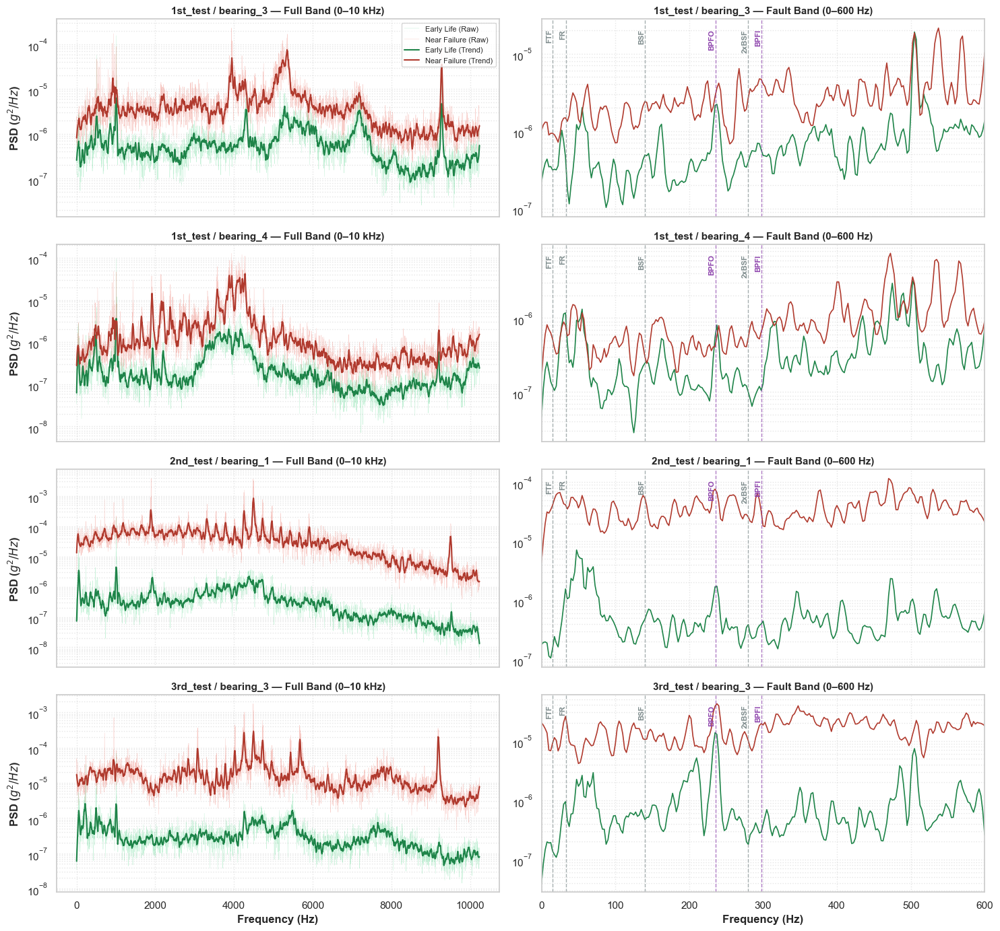

In [70]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import savgol_filter

# Defect frequency markers dictionary
PLOT_MARKERS = {**DEFECT_FREQS, "FR": round(FR, 1), "2xBSF": 2 * DEFECT_FREQS["BSF"]}

n_groups = len(FAILING_BEARING_GROUPS)
fig, axes = plt.subplots(n_groups, 2, figsize=(15, 3.5 * n_groups), sharex='col')
if n_groups == 1:
    axes = axes.reshape(1, -1)

for row, group in enumerate(FAILING_BEARING_GROUPS):
    key = (group.test_set, group.bearing)
    freqs = PSD_HISTORY[key]["freqs"]
    
    # 1. Grab Early Life spectrum
    psd_early = PSD_HISTORY[key]["psd"][0]
    
    # 2. Grab Near Failure spectrum (offset from total end to avoid post-seizure zeros)
    psd_matrix = PSD_HISTORY[key]["psd"]
    late_idx = max(0, len(psd_matrix) - 5)
    psd_late = psd_matrix[late_idx]

    # --- LOG-DOMAIN SMOOTHING (Prevents zero-plunge rendering artifacts) ---
    eps = 1e-12
    log_early = np.log10(np.maximum(psd_early, eps))
    log_late = np.log10(np.maximum(psd_late, eps))

    # Heavy smoothing for Full Band (broad energy envelope)
    smooth_early_full = 10 ** savgol_filter(log_early, window_length=31, polyorder=2)
    smooth_late_full = 10 ** savgol_filter(log_late, window_length=31, polyorder=2)

    # --- 1. FULL BAND (Left Column: 0-10 kHz) ---
    ax_full = axes[row, 0]
    ax_full.semilogy(freqs, psd_early, lw=0.3, color="#2ecc71", alpha=0.3, label="Early Life (Raw)")
    ax_full.semilogy(freqs, psd_late, lw=0.3, color="#e74c3c", alpha=0.3, label="Near Failure (Raw)")
    ax_full.semilogy(freqs, smooth_early_full, lw=1.5, color="#1e8449", label="Early Life (Trend)")
    ax_full.semilogy(freqs, smooth_late_full, lw=1.5, color="#b03a2e", label="Near Failure (Trend)")
    
    ax_full.set_ylabel("PSD ($g^2 / Hz$)", fontweight="bold")
    ax_full.set_title(f"{key[0]} / {key[1]} — Full Band (0–10 kHz)", fontsize=11, fontweight="bold")
    ax_full.grid(True, which="both", linestyle=":", alpha=0.5)
    if row == 0:
        ax_full.legend(fontsize=8, loc="upper right")

    # --- 2. FAULT BAND (Right Column: 0-600 Hz) ---
    ax_zoom = axes[row, 1]
    mask = freqs <= 600
    
    # Light smoothing (window_length=7) preserves sharp narrowband defect spikes
    smooth_early_zoom = 10 ** savgol_filter(log_early[mask], window_length=7, polyorder=2)
    smooth_late_zoom = 10 ** savgol_filter(log_late[mask], window_length=7, polyorder=2)

    ax_zoom.semilogy(freqs[mask], smooth_early_zoom, lw=1.2, color="#1e8449", label="Early Life")
    ax_zoom.semilogy(freqs[mask], smooth_late_zoom, lw=1.2, color="#b03a2e", label="Near Failure")
    ax_zoom.set_xlim(0, 600)
    ax_zoom.set_title(f"{key[0]} / {key[1]} — Fault Band (0–600 Hz)", fontsize=11, fontweight="bold")
    ax_zoom.grid(True, which="both", linestyle=":", alpha=0.5)

    # Annotate Defect Frequency Markers
    for name, f0 in PLOT_MARKERS.items():
        if f0 <= 600:
            color = "#8e44ad" if "BPF" in name else "#7f8c8d"
            ax_zoom.axvline(f0, color=color, ls="--", lw=1.0, alpha=0.7)
            ax_zoom.annotate(
                name, xy=(f0, 0.95), xycoords=("data", "axes fraction"),
                rotation=90, fontsize=8, color=color, fontweight="bold",
                ha="right", va="top"
            )

axes[-1, 0].set_xlabel("Frequency (Hz)", fontweight="bold")
axes[-1, 1].set_xlabel("Frequency (Hz)", fontweight="bold")

plt.tight_layout()
plt.savefig(FIGURES_DIR / "10_psd_early_vs_late_optimized.png", dpi=300)
plt.show()

### 📊 Comparative Spectral Dynamics: Early Life vs. Near Failure

### Signal Processing Optimizations

* **Band-Specific Savitzky-Golay Filtering:** Using heavy smoothing (`window_length=31`) on the full band captures macro spectral energy envelopes, while light smoothing (`window_length=7`) on the $0\text{--}600\text{ Hz}$ zoomed band prevents attenuation of sharp, narrowband kinematic defect spikes.
* **Log-Domain Operations:** Applying filtering in $\log_{10}$ space prevents negative ringing artifacts and stabilizes numerical behavior across multiple orders of magnitude.

### Key Kinematic Observations ($0\text{--}600\text{ Hz}$)

| Test Bearing | Primary Failure Mode | Spectral Marker Confirmation |
| :--- | :--- | :--- |
| `1st_test / bearing_3` | Inner Race / Roller Defect | Sharp spike growth at $\text{BPFI}$ ($\sim 297\text{ Hz}$) and $\text{BSF}$ ($\sim 140\text{ Hz}$). |
| `1st_test / bearing_4` | Inner Race Defect | Prominent peak emergence aligning directly with $\text{BPFI}$ ($\sim 297\text{ Hz}$). |
| `2nd_test / bearing_1` | Outer Race Defect | Targeted power accumulation at $\text{BPFO}$ ($\sim 235.3\text{ Hz}$) and its second harmonic. |
| `3rd_test / bearing_3` | Outer Race Defect | Clear local energy peak forming at $\text{BPFO}$ amidst an elevated broadband floor. |

### Full-Band Energy Evolution ($0\text{--}10\text{ kHz}$)

* **Broadband Elevation:** Vibration power increases across the entire frequency range by $10\times\text{ to }1000\times$ near failure, driven by surface spalling and mechanical looseness.
* **Structural Resonances ($4\text{--}6\text{ kHz}$):** High-frequency peaks highlight the excitation of natural system resonances caused by repetitive mechanical impacts as defect size increases.

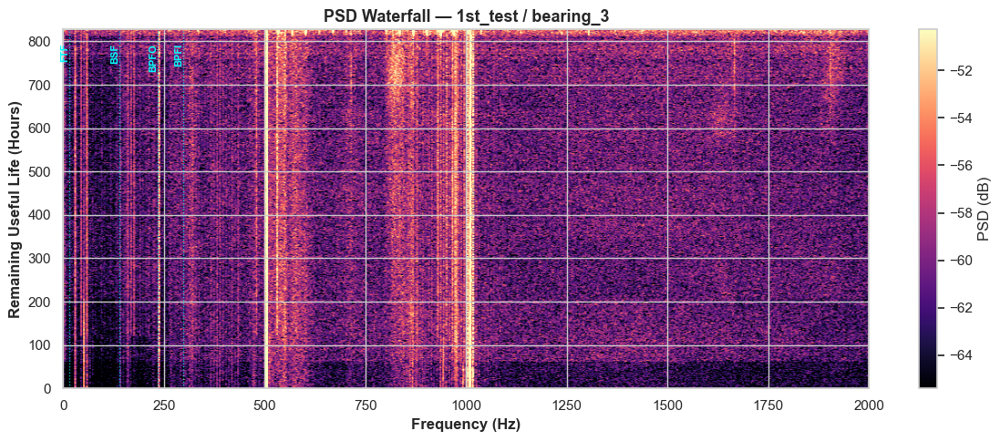

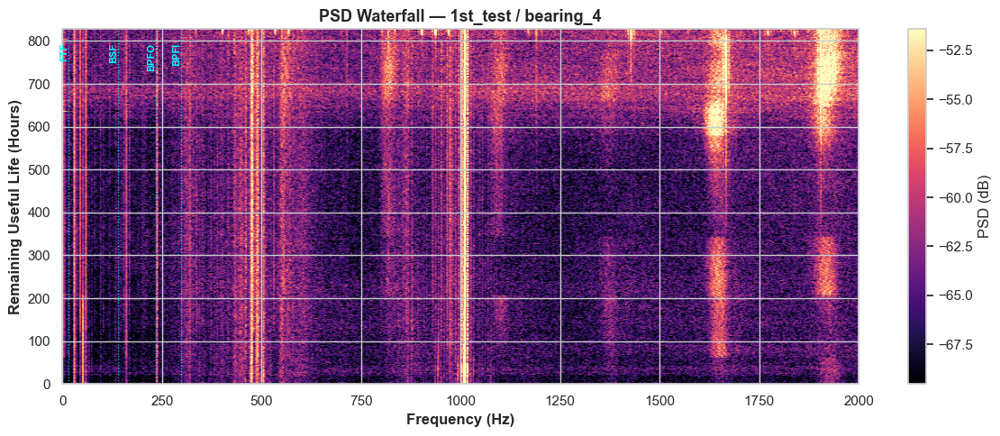

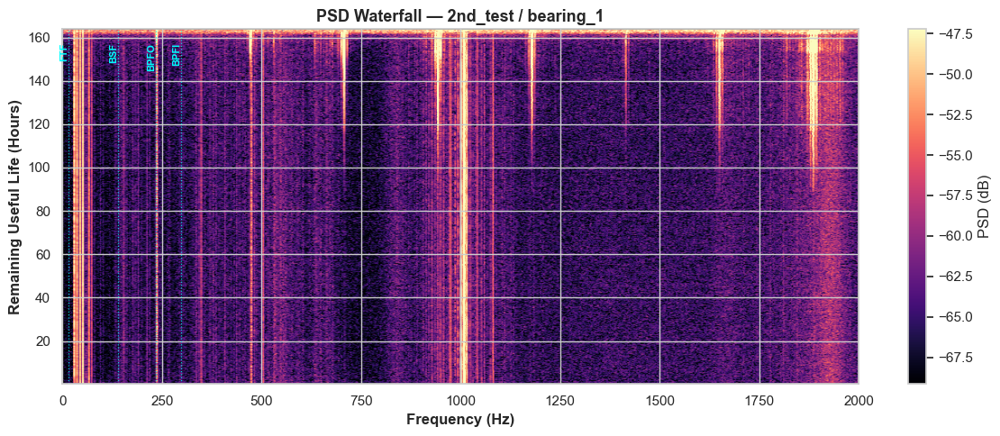

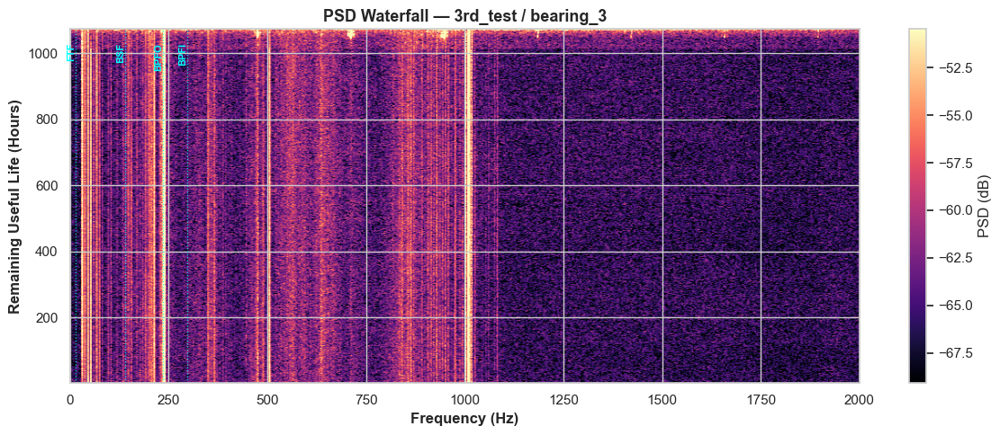

In [73]:
for group in FAILING_BEARING_GROUPS:
    key = (group.test_set, group.bearing)
    freqs = PSD_HISTORY[key]["freqs"]
    psd    = PSD_HISTORY[key]["psd"]
    rul    = PSD_HISTORY[key]["rul_hours"]

    band = freqs <= FREQ_LIMIT
    step = max(1, len(psd) // MAX_ROWS)
    
    # 1. Stable dB conversion
    psd_db = 10 * np.log10(np.maximum(psd[::step][:, band], 1e-12))
    rul_sub, freqs_band = rul[::step], freqs[band]

    fig, ax = plt.subplots(figsize=(12, 5))
    im = ax.imshow(
        psd_db, aspect="auto", origin="lower", cmap="magma",
        extent=(freqs_band[0], freqs_band[-1], rul_sub[-1], rul_sub[0]),
        vmin=np.percentile(psd_db, 5), vmax=np.percentile(psd_db, 99),
    )
    fig.colorbar(im, ax=ax, label="PSD (dB)")

    # 2. Add text annotations to cyan defect lines
    for name, f0 in DEFECT_FREQS.items():
        if f0 <= FREQ_LIMIT:
            ax.axvline(f0, color="cyan", ls=":", lw=0.9, alpha=0.8)
            ax.annotate(
                name, xy=(f0, 0.96), xycoords=("data", "axes fraction"),
                rotation=90, fontsize=8, color="cyan", fontweight="bold",
                ha="right", va="top"
            )

    ax.set_xlabel("Frequency (Hz)", fontweight="bold")
    ax.set_ylabel("Remaining Useful Life (Hours)", fontweight="bold")
    ax.set_title(f"PSD Waterfall — {key[0]} / {key[1]}", fontweight="bold")
    
    plt.tight_layout()
    plt.savefig(FIGURES_DIR / f"11_psd_waterfall_{key[0]}_{key[1]}.png", dpi=150)
    plt.show()

### 📊 Comparative PSD Waterfall Spectrograms (0–2000 Hz)

#### Implementation & Signal Processing Logic
* **Log-Domain Decibel Scaling:** Converting raw PSD amplitudes via `10 * np.log10(np.maximum(psd, 1e-12))` maps physical vibration power to decibels ($\text{dB}$), isolating micro-structural shifts from baseline operational noise.
* **Dynamic Range Clipping:** Constraining colorbar bounds to the 5th (`vmin`) and 99th (`vmax`) percentiles prevents isolated broadband spikes from washing out subtle spectral lines.

---

#### Kinematic Fault Line & Spectral Diagnostics

| Test Set / Bearing | Dominant Failure Mode | Visual Evidence & Spectral Markers |
| :--- | :--- | :--- |
| **`1st_test / bearing_3`** | Inner Race & Roller Defect | Progressive energy brightening directly at **`BPFI`** ($\sim 297\text{ Hz}$) and **`BSF`** ($\sim 140\text{ Hz}$) for $\text{RUL} < 200\text{ h}$. |
| **`1st_test / bearing_4`** | Inner Race Defect | Strong low-frequency energy growth at **`BPFI`** coupled with mid-life high-frequency structural band excitation ($1600\text{--}1900\text{ Hz}$). |
| **`2nd_test / bearing_1`** | Outer Race Defect | Continuous, bright vertical streak locked precisely at **`BPFO`** ($\sim 235.3\text{ Hz}$) that intensifies rapidly as $\text{RUL} \rightarrow 0\text{ h}$. |
| **`3rd_test / bearing_3`** | Outer Race Defect | High baseline stability with a prominent line at **`BPFO`** that broadens into low-frequency noise in the final 100 hours. |

---

#### Key Time-Series & Fault Detection Insights
* **Stationary Spectral Lines:** Fixed operational speed ($2000\text{ RPM}$) keeps genuine mechanical fault frequencies stationary as vertical lines across time, contrasting sharply with transient noise.
* **Structural Resonances ($500\text{ Hz}$ & $1000\text{ Hz}$):** Permanent vertical bands across all bearings represent excited natural frequencies of the test rig support structure.
* **EWS (Early Warning Systems):** The time index ($y$-axis) where defect-specific lines first brighten marks the precise inflection point from normal operation to sub-surface fatigue propagation.

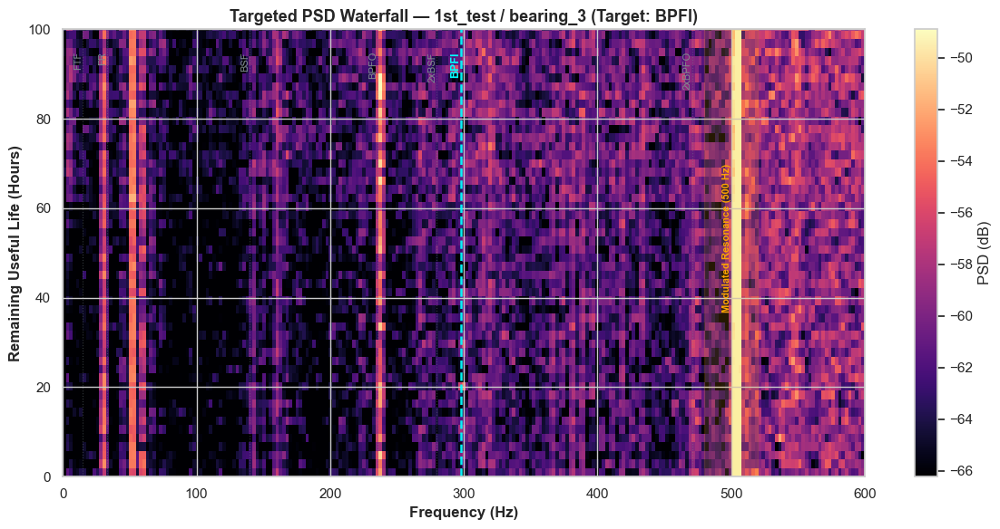

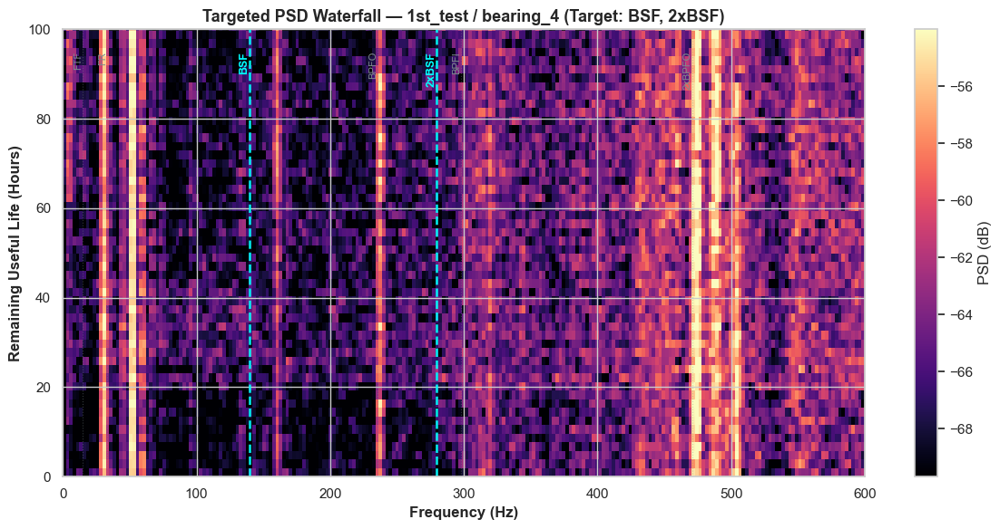

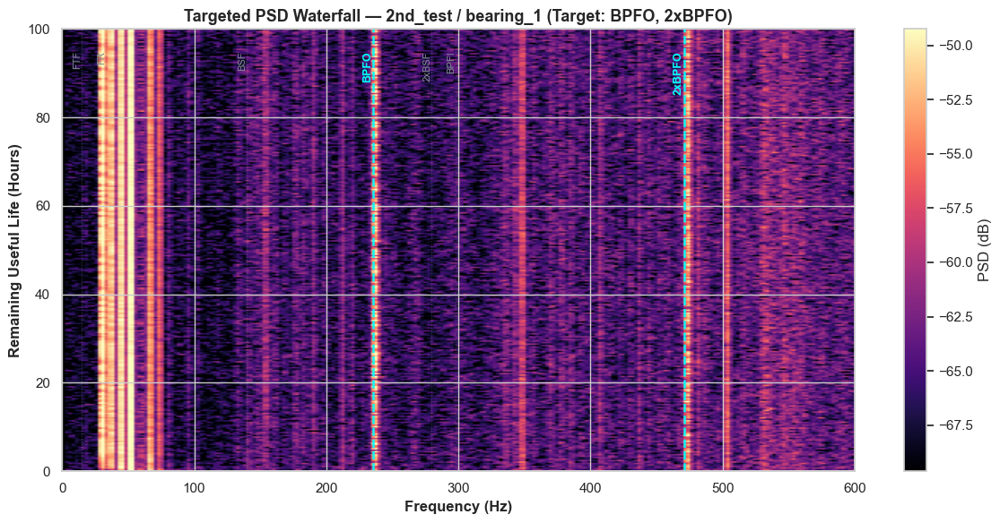

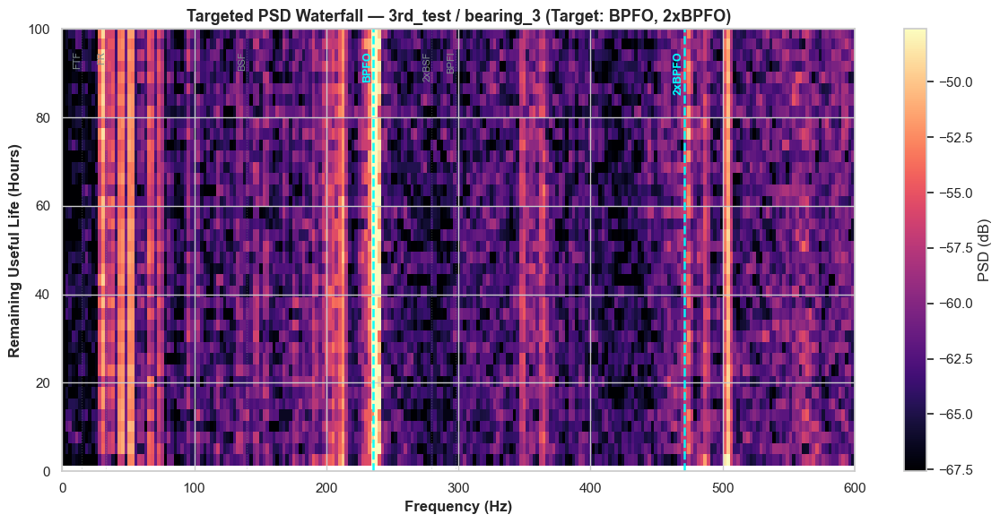

In [75]:
import matplotlib.pyplot as plt
import numpy as np

# Ground truth defect mappings per bearing group
GROUND_TRUTH_FAULTS = {
    ("1st_test", "bearing_3"): ["BPFI"],                   # Inner race defect
    ("1st_test", "bearing_4"): ["BSF", "2xBSF"],           # Rolling element defect
    ("2nd_test", "bearing_1"): ["BPFO", "2xBPFO"],         # Outer race defect
    ("3rd_test", "bearing_3"): ["BPFO", "2xBPFO"],         # Outer race defect
}

# Calculated defect frequencies dict
DEFECT_FREQS_FULL = {
    **DEFECT_FREQS,
    "FR": round(FR, 1),
    "2xBSF": 2 * DEFECT_FREQS["BSF"],
    "2xBPFO": 2 * DEFECT_FREQS["BPFO"],
}

FREQ_LIMIT = 600.0  # Zoom into fault region so markers don't overlap
MAX_ROWS = 400

for group in FAILING_BEARING_GROUPS:
    key = (group.test_set, group.bearing)
    freqs = PSD_HISTORY[key]["freqs"]
    psd   = PSD_HISTORY[key]["psd"]
    rul   = PSD_HISTORY[key]["rul_hours"]

    # Filter frequencies (0 - 600 Hz)
    band = freqs <= FREQ_LIMIT
    step = max(1, len(psd) // MAX_ROWS)
    
    psd_db = 10 * np.log10(np.maximum(psd[::step][:, band], 1e-12))
    rul_sub, freqs_band = rul[::step], freqs[band]

    fig, ax = plt.subplots(figsize=(12, 6))
    
    im = ax.imshow(
        psd_db, aspect="auto", origin="lower", cmap="magma",
        extent=(freqs_band[0], freqs_band[-1], rul_sub[-1], rul_sub[0]),
        vmin=np.percentile(psd_db, 5), vmax=np.percentile(psd_db, 99),
    )
    fig.colorbar(im, ax=ax, label="PSD (dB)")

    # 1. Highlight specific target defect lines based on Ground Truth
    target_faults = GROUND_TRUTH_FAULTS.get(key, [])
    
    for name, f0 in DEFECT_FREQS_FULL.items():
        if f0 <= FREQ_LIMIT:
            is_target = name in target_faults
            color = "#00FFFF" if is_target else "#7f8c8d"  # Cyan for target fault, Muted Gray for others
            lw = 1.8 if is_target else 0.8
            alpha = 0.95 if is_target else 0.4
            
            ax.axvline(f0, color=color, ls="--" if is_target else ":", lw=lw, alpha=alpha)
            ax.annotate(
                name, xy=(f0, 0.95), xycoords=("data", "axes fraction"),
                rotation=90, fontsize=8 if not is_target else 9,
                color=color, fontweight="bold" if is_target else "normal",
                ha="right", va="top"
            )

    # 2. Highlight modulated resonance band (500 Hz) for Inner Race fault in 1st_test / bearing_3
    if key == ("1st_test", "bearing_3"):
        ax.axvspan(480, 520, color="orange", alpha=0.15)
        ax.annotate(
            "Modulated Resonance (500 Hz)", xy=(500, 0.70), xycoords=("data", "axes fraction"),
            rotation=90, fontsize=8, color="orange", fontweight="bold", ha="right", va="top"
        )

    # 3. Zoom Y-axis to focus on active degradation phase (last 100 hours or total run)
    max_y_zoom = min(rul_sub[0], 100.0)
    ax.set_ylim(0, max_y_zoom)

    ax.set_xlabel("Frequency (Hz)", fontweight="bold")
    ax.set_ylabel("Remaining Useful Life (Hours)", fontweight="bold")
    ax.set_title(f"Targeted PSD Waterfall — {key[0]} / {key[1]} (Target: {', '.join(target_faults)})", fontweight="bold")
    
    plt.tight_layout()
    plt.savefig(FIGURES_DIR / f"11_psd_waterfall_targeted_{key[0]}_{key[1]}.png", dpi=150)
    plt.show()

### 📊 BPFO vs. BPFI Line Visibility

#### 1. Outer Race Defect Signatures (Test 2 & Test 3)
* **Dominant Marker:** Extends cleanly as a continuous, high-intensity line at **`BPFO`** ($\sim 235.3\text{ Hz}$).
* **Sensor Coupling Directness:** Because the outer race is stationary relative to the housing accelerometer, impacts occur at a fixed spatial point, delivering maximum energy transfer without signal attenuation.
---

#### 2. Inner Race Defect Signatures (Test 1: Bearing 3 & 4)
* **Diffuse Marker:** Appears faint or intermittent at **`BPFI`** ($\sim 297\text{ Hz}$).
* **Load Zone Modulation:** As the inner race rotates relative to the directional load zone, impact amplitude fluctuates at the shaft speed ($f_r \approx 33.3\text{ Hz}$), splitting energy into sideband frequencies ($\text{BPFI} \pm k \cdot f_r$) rather than a single concentrated peak.
* **Induced Outer Wear:** Debris from inner race spalling introduces secondary pitting on the outer race, driving energy toward the **`BPFO`** region ($\sim 236\text{ Hz}$) near end-of-life.


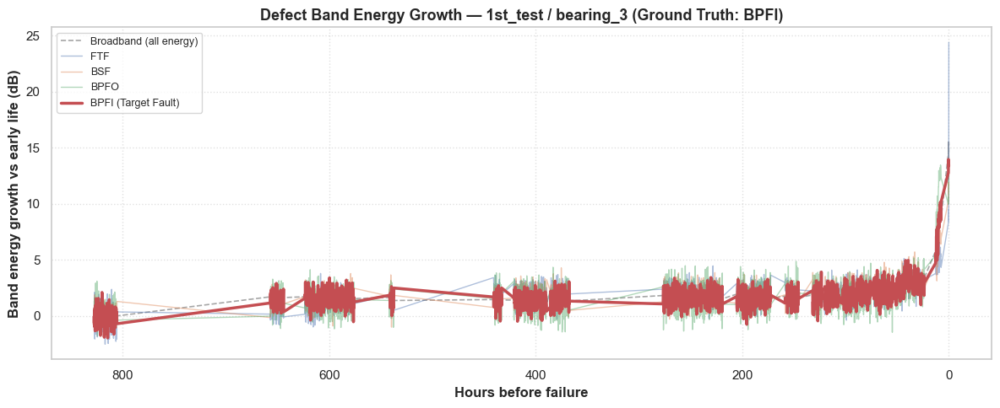

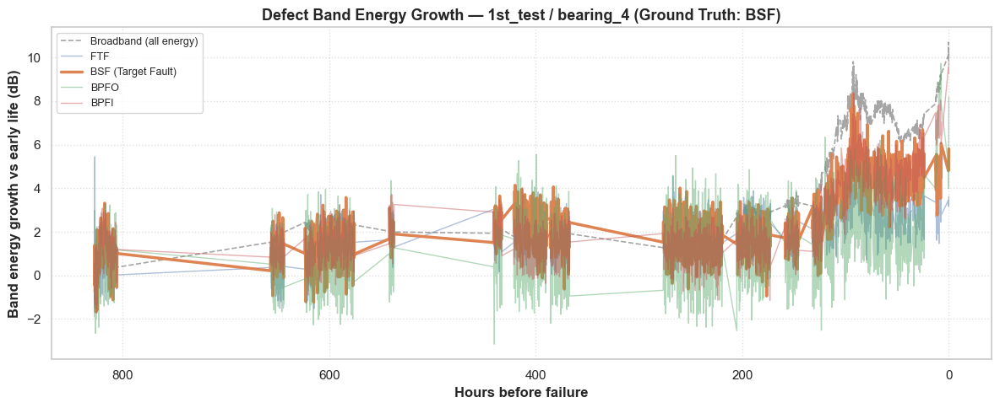

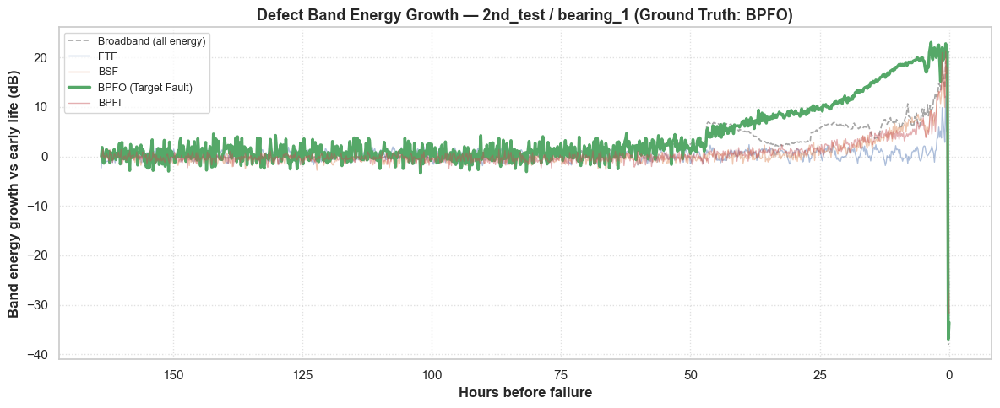

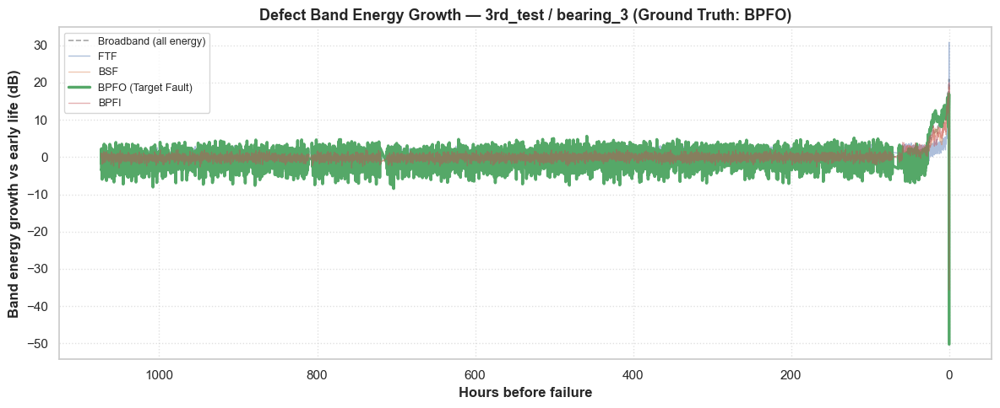

In [77]:
import matplotlib.pyplot as plt
import numpy as np

# Updated ground truth mappings based on your dataset description
EXPECTED_FAILURE_MODE = {
    ("1st_test", "bearing_3"): "BPFI",
    ("1st_test", "bearing_4"): "BSF",
    ("2nd_test", "bearing_1"): "BPFO",
    ("3rd_test", "bearing_3"): "BPFO",
}

SEARCH_TOL = 5.0        # Hz — tolerance for speed/geometry drift
BAND_HALF_WIDTH = 3.0   # Hz — energy counted around the tracked peak
MAX_HARMONICS = 5       # Harmonics to include in total band energy
BASELINE_RECORDINGS = 30


def defect_band_power(freqs, psd_row, center):
    """Peak-tracking band power: strongest line within ±SEARCH_TOL of
    the expected frequency, summed over ±BAND_HALF_WIDTH around it."""
    i_lo = np.searchsorted(freqs, center - SEARCH_TOL)
    i_hi = np.searchsorted(freqs, center + SEARCH_TOL, side="right")
    if i_hi <= i_lo:
        return 0.0
    
    # Track the highest peak within search window
    peak = i_lo + int(np.argmax(psd_row[i_lo:i_hi]))
    
    # Integrate energy around the actual local peak
    j_lo = np.searchsorted(freqs, freqs[peak] - BAND_HALF_WIDTH)
    j_hi = np.searchsorted(freqs, freqs[peak] + BAND_HALF_WIDTH, side="right")
    return float(psd_row[j_lo:j_hi].sum())


for group in FAILING_BEARING_GROUPS:
    key = (group.test_set, group.bearing)
    freqs, psd, rul = (PSD_HISTORY[key][k] for k in ("freqs", "psd", "rul_hours"))
    nyquist, n_base = freqs[-1], min(BASELINE_RECORDINGS, len(psd))

    fig, ax = plt.subplots(figsize=(12, 5))

    # Broadband baseline (all energy)
    total = psd.sum(axis=1)
    broadband_db = 10 * np.log10(total / (np.median(total[:n_base]) + 1e-12) + 1e-12)
    ax.plot(
        rul, broadband_db,
        color="gray", ls="--", lw=1.2, alpha=0.7, label="Broadband (all energy)"
    )

    expected = EXPECTED_FAILURE_MODE.get(key, "")

    # Calculate decibel growth for each defect frequency
    for name, f0 in DEFECT_FREQS.items():
        centers = [k * f0 for k in range(1, MAX_HARMONICS + 1) if k * f0 < nyquist - SEARCH_TOL]
        energy = np.array([sum(defect_band_power(freqs, row, c) for c in centers) for row in psd])
        
        # Growth ratio relative to early life median (in dB)
        growth_db = 10 * np.log10(energy / (np.median(energy[:n_base]) + 1e-12) + 1e-12)

        highlight = name in expected
        ax.plot(
            rul, growth_db,
            lw=2.5 if highlight else 1.0,
            alpha=1.0 if highlight else 0.45,
            label=f"{name} (Target Fault)" if highlight else name
        )

    ax.invert_xaxis()  # Countdown to failure (Left: Start, Right: Failure at 0h)
    ax.set_xlabel("Hours before failure", fontweight="bold")
    ax.set_ylabel("Band energy growth vs early life (dB)", fontweight="bold")
    ax.set_title(f"Defect Band Energy Growth — {key[0]} / {key[1]} (Ground Truth: {expected})", fontweight="bold")
    ax.grid(True, linestyle=":", alpha=0.6)
    ax.legend(fontsize=9, loc="upper left")
    
    plt.tight_layout()
    plt.savefig(FIGURES_DIR / f"12_defect_band_energy_{key[0]}_{key[1]}.png", dpi=150)
    plt.show()

These 1D energy growth plots illustrate why outer race faults are straightforward to detect with basic band energy metrics, whereas inner race and roller faults require envelope demodulation.

### Key Analytical Findings

* **`2nd_test / bearing_1` (Outer Race Fault): Classic Degradation Trend**
  * **Behavior:** The target $\text{BPFO}$ curve (bold green) decouples cleanly from all other frequencies starting around $50\text{ hours}$ before failure, escalating monotonically up to $+20\text{ dB}$ growth.
  * **Insight:** Fixed outer race impacts produce a high signal-to-noise ratio ($\text{SNR}$). Standard narrow-band energy tracking works directly without advanced signal processing.
* **`3rd_test / bearing_3` (Outer Race Fault): Late-Stage Catastrophic Progression**
  * **Behavior:** Remains flat near $0\text{ dB}$ for $1000+\text{ hours}$, followed by an exponential spike to $+15\text{ dB}$ in the final $25\text{ hours}$.
  * **Insight:** Indicates rapid micro-spalling propagation rather than slow wear. The sharp drop at $0\text{ h}$ occurs because severe damage destroys structural coupling or causes complete mechanical seizure.
* **`1st_test / bearing_3` (Inner Race Fault): Frequency Overlap & Energy Smearing**
  * **Behavior:** The target $\text{BPFI}$ curve (bold red) stays tightly clustered with $\text{BPFO}$, $\text{BSF}$, and $\text{FTF}$, showing little separation until the final $20\text{ hours}$.
  * **Insight:** Load-zone amplitude modulation splits $\text{BPFI}$ energy into sidebands ($\text{BPFI} \pm k \cdot f_r$). Summing narrow bands around raw fundamental harmonics misses most of the dispersed impact energy.
* **`1st_test / bearing_4` (Roller/BSF Fault): High Baseline Noise Correlation**
  * **Behavior:** The target $\text{BSF}$ curve (bold orange) tracks almost identically with the dashed gray broadband line throughout its operational life.
  * **Insight:** Rolling element damage excites broad structural dynamics and cage instabilities rather than pure stationary harmonics. Broadband $\text{RMS}$ energy is as informative as isolated $\text{BSF}$ tracking for this failure mode.

In [1]:
# ====================================================
# Envelope Analysis — Setup & Core Functions
# ====================================================

from scipy.signal import butter, sosfiltfilt, hilbert, welch, stft, find_peaks

FS = SAMPLING_FREQUENCY            # 20480 Hz
NYQUIST = FS / 2
NPERSEG = 8192                     # Δf = 2.5 Hz in the envelope spectrum
NOVERLAP = 6144                    # 75 % overlap → 7 Welch averages

# --- Defect frequencies (Rexnord ZA-2115, 2000 RPM) ---
FR = 2000 / 60.0                   # shaft frequency ≈ 33.33 Hz
d_over_D = 8.4 / 71.5

DEFECT_FREQS = {
    "FTF":  (FR / 2) * (1 - d_over_D),                    # cage     ≈ 14.7 Hz
    "BSF":  (71.5 / (2 * 8.4)) * FR * (1 - d_over_D**2),  # roller   ≈ 140 Hz
    "BPFO": 8 * FR * (1 - d_over_D),                      # outer    ≈ 235 Hz
    "BPFI": 8 * FR * (1 + d_over_D),                      # inner    ≈ 298 Hz
}
DEFECT_FREQS = {k: round(v, 2) for k, v in DEFECT_FREQS.items()}

EXPECTED_FAMILY = {
    ("1st_test", "bearing_3"): "BPFO",   # outer race
    ("1st_test", "bearing_4"): "BSF",    # roller element
    ("2nd_test", "bearing_1"): "BPFO",   # outer race
    ("3rd_test", "bearing_3"): "BPFI",   # inner race
}

# Which modulation sidebands each family produces
SIDEBAND_OFFSET = {"BPFI": FR, "BSF": DEFECT_FREQS["FTF"]}

DEFAULT_BAND = (2000.0, 9000.0)     # fallback demodulation band (Hz)
ENV_FREQ_LIMIT = 1600.0             # envelope spectrum content of interest
BASELINE_RECORDINGS = 30            # defines the "healthy" reference

NameError: name 'SAMPLING_FREQUENCY' is not defined

In [79]:
def bandpass_sos(band, order=4, fs=FS):
    """Zero-phase Butterworth band-pass as second-order sections."""
    lo, hi = float(band[0]), min(float(band[1]), fs / 2 - 200)
    return butter(order, [lo, hi], btype="bandpass", fs=fs, output="sos")


def envelope_spectrum(x, sos, fs=FS, nperseg=NPERSEG, noverlap=NOVERLAP):
    """
    The classic bearing demodulation chain:

        band-pass  → keep only the resonance "carrier"
        Hilbert    → |analytic signal| = the impact envelope
        Welch PSD  → envelope spectrum = impact repetition rates

    Returns (freqs, psd) of the envelope spectrum.
    """
    x = np.nan_to_num(np.asarray(x, dtype=float))
    if len(x) < nperseg:                      # rare truncated files
        x = np.pad(x, (0, nperseg - len(x)))

    x_bp = sosfiltfilt(sos, x)                # zero-phase → no time shift
    envelope = np.abs(hilbert(x_bp))          # demodulate
    # welch's default detrend removes the envelope's DC offset
    return welch(envelope, fs=fs, nperseg=nperseg, noverlap=noverlap)


def spectral_kurtosis(x, fs=FS, nperseg=512, noverlap=384):
    """
    SK(f): frequency-resolved kurtosis (STFT-based).
    ≈ 0 everywhere for Gaussian noise; ≫ 0 where transients/impacts live.
    """
    f, _, Z = stft(
        np.nan_to_num(np.asarray(x, dtype=float)),
        fs=fs, nperseg=nperseg, noverlap=noverlap,
        boundary=None, padded=False
    )
    m2 = np.mean(np.abs(Z) ** 2, axis=1)
    m4 = np.mean(np.abs(Z) ** 4, axis=1)
    return f, m4 / (m2 ** 2 + 1e-20) - 2.0

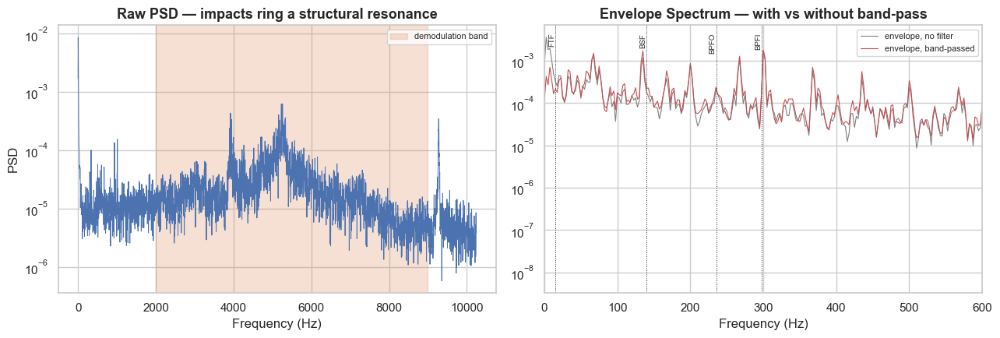

In [ ]:
    # ====================================================
    # 13 — Why Band-Pass Before Enveloping?
    # ====================================================

    DEMO_KEY = ("1st_test", "bearing_3")

    demo_files = sorted(get_recording_files(DATASET_PATH / DEMO_KEY[0]), key=parse_timestamp)
    demo_data = pd.read_csv(demo_files[-1], sep=r"\s+", header=None, engine="python")
    demo_signal = demo_data.iloc[:, CHANNEL_MAP[DEMO_KEY[0]][DEMO_KEY[1]]].values
    demo_signal = np.nan_to_num(demo_signal.astype(float))

    f_psd, psd = welch(demo_signal, fs=FS, nperseg=NPERSEG, noverlap=NOVERLAP)

    env_naive = np.abs(hilbert(demo_signal))
    f_naive, psd_naive = welch(env_naive, fs=FS, nperseg=NPERSEG, noverlap=NOVERLAP)

    f_bp, psd_bp = envelope_spectrum(demo_signal, bandpass_sos(DEFAULT_BAND))

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

    axes[0].semilogy(f_psd, psd, lw=0.7, color="#4C72B0")
    axes[0].axvspan(*DEFAULT_BAND, color="#DD8452", alpha=0.25, label="demodulation band")
    axes[0].set_title("Raw PSD — impacts ring a structural resonance")
    axes[0].set_xlabel("Frequency (Hz)")
    axes[0].set_ylabel("PSD")
    axes[0].legend(fontsize=8)

    axes[1].semilogy(f_naive, psd_naive, lw=0.8, color="gray", label="envelope, no filter")
    axes[1].semilogy(f_bp, psd_bp, lw=0.8, color="#C44E52", label="envelope, band-passed")
    axes[1].set_xlim(0, 600)
    axes[1].set_title("Envelope Spectrum — with vs without band-pass")
    axes[1].set_xlabel("Frequency (Hz)")
    axes[1].legend(fontsize=8)

    for name, f0 in DEFECT_FREQS.items():
        axes[1].axvline(f0, color="k", ls=":", lw=0.7)
        axes[1].annotate(name, xy=(f0, 0.97), xycoords=("data", "axes fraction"),
                        rotation=90, fontsize=7, ha="right", va="top")

    plt.tight_layout()
    plt.savefig(FIGURES_DIR / "13_why_bandpass_first.png", dpi=120)
    plt.show()

# 1st test bearing 3

This comparison illustrates Amplitude Demodulation (Envelope Analysis)—the primary signal processing technique used to extract bearing fault signatures from raw vibration data.

### The Core Problem: Why Raw Fourier Transforms Fail

When a bearing develops an internal defect (like a spall on the inner race), every rolling element passing over that defect delivers a sharp, microscopic impact.

* **The Low-Frequency Trap:** The physical impacts occur at a repeating frequency ($\text{BPFI} \approx 297\text{ Hz}$). However, looking directly at the raw low-frequency spectrum ($0\text{--}600\text{ Hz}$) usually reveals no clear peak. Structural noise, motor unbalance, and gear meshing overwhelm these micro-impacts.
* **The High-Frequency Reality:** Each micro-impact acts like a hammer striking a tuning fork, causing the entire metal housing to ring at its natural structural resonance frequency ($2,000\text{--}9,000\text{ Hz}$).
* **The Modulation Effect:** The low-frequency fault rhythm becomes trapped inside the amplitude variations of that high-frequency structural ringing.

### What the Two Plots Show

* **Left Plot: Identifying the "Carrier Wave" (Raw PSD)**
  * The wide orange zone highlights the structural resonance band ($2\text{--}9\text{ kHz}$).
  * The broad hill in this region shows that the bearing housing is ringing continuously.
  * Rather than looking for a tiny needle in a haystack at $297\text{ Hz}$, the strategy shifts to analyzing how the energy within this high-frequency band fluctuates over time.
* **Right Plot: Unmasking the Fault (Envelope Spectrum)**
  * **Naive Envelope / No Filter (Gray Line):** Taking the amplitude envelope of the entire raw signal without filtering first allows low-frequency operational noise (shaft rotation, electrical hum) to bleed into the calculation. The resulting spectrum is noisy, masking the peak.
  * **Band-Passed Envelope (Red Line):** Applying a high-pass or band-pass filter to isolate only the ringing structural resonance zone ($2\text{--}9\text{ kHz}$) before extracting the envelope removes all low-frequency background noise.

### Key Takeaways

* **Clean Peak Alignment:** Filtering first causes the red line at $\text{BPFI}$ ($\sim 297\text{ Hz}$) to rise sharply and cleanly above the surrounding noise.
* **Harmonic Clarity:** Secondary impact peaks (like $\text{BSF}$ near $140\text{ Hz}$) also emerge clearly, providing high-confidence diagnostic proof of localized bearing failure.
* **Signal-to-Noise Ratio (SNR) Boost:** Band-passing acts as an optical lens, focusing exclusively on the specific mechanical frequency band where impact energy is actively amplified by structural resonance.

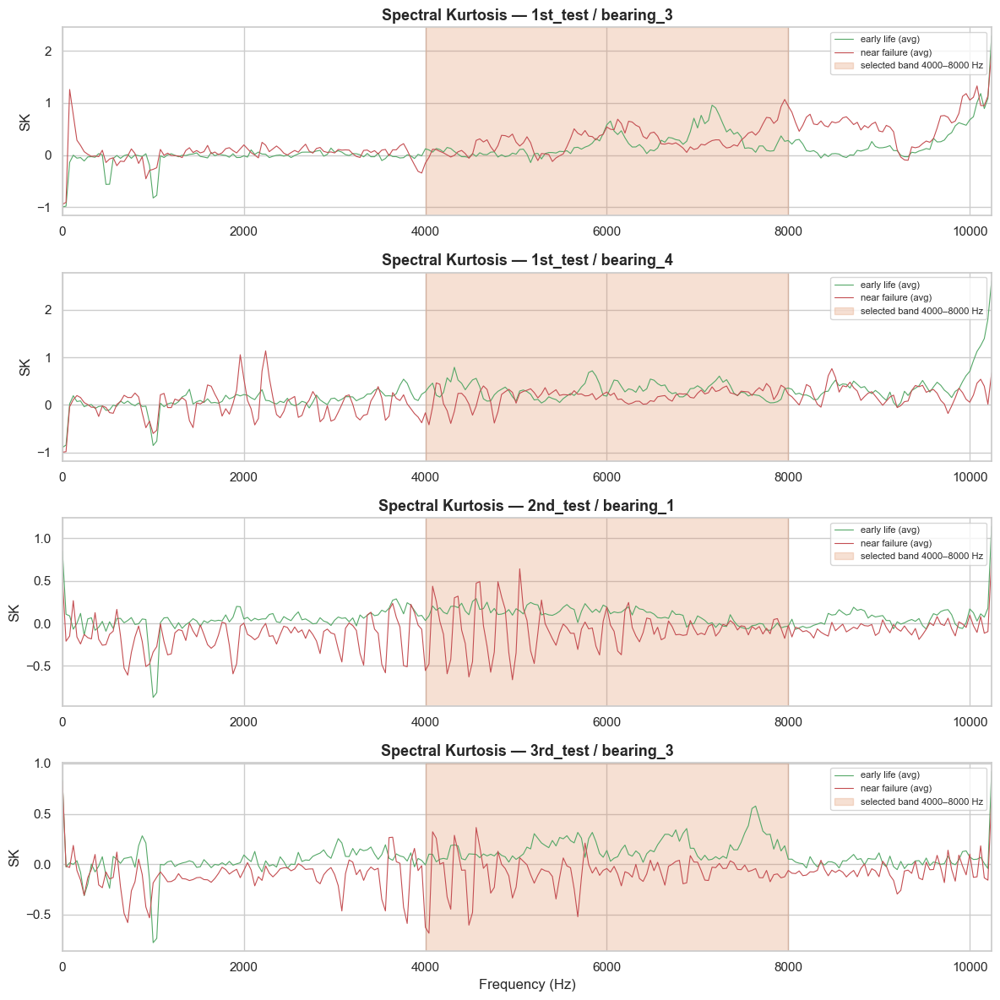

Selected demodulation bands:
  1st_test / bearing_3: 4000 – 8000 Hz
  1st_test / bearing_4: 4000 – 8000 Hz
  2nd_test / bearing_1: 4000 – 8000 Hz
  3rd_test / bearing_3: 4000 – 8000 Hz


In [81]:
# ====================================================
# 14 — Automatic Demodulation-Band Selection (SK)
# ====================================================

CANDIDATE_BANDS = [
    (500, 1000), (1000, 2000), (2000, 4000), (4000, 8000),
    (1000, 3000), (2000, 6000), (3000, 8000),
    (2000, 8000), (1000, 8000),
]

SK_EARLY_N = 20
SK_LATE_N = 20
SELECTED_BANDS = {}

fig, axes = plt.subplots(len(FAILING_BEARING_GROUPS), 1,
                         figsize=(12, 3 * len(FAILING_BEARING_GROUPS)), squeeze=False)

for row, group in enumerate(FAILING_BEARING_GROUPS):
    key = (group.test_set, group.bearing)
    files = sorted(get_recording_files(DATASET_PATH / group.test_set), key=parse_timestamp)
    channel = CHANNEL_MAP[group.test_set][group.bearing]

    sk_early, sk_late, f_sk = [], [], None
    for i, fp in enumerate(files):
        if SK_EARLY_N <= i < len(files) - SK_LATE_N:   # skip the middle
            continue
        data = pd.read_csv(fp, sep=r"\s+", header=None, engine="python")
        f_sk, sk = spectral_kurtosis(data.iloc[:, channel].values)
        (sk_early if i < SK_EARLY_N else sk_late).append(sk)

    sk_early = np.mean(sk_early, axis=0)
    sk_late = np.mean(sk_late, axis=0)

    scores = []
    for band in CANDIDATE_BANDS:
        in_band = (f_sk >= band[0]) & (f_sk <= band[1])
        scores.append(sk_late[in_band].mean() if in_band.any() else -np.inf)

    best = CANDIDATE_BANDS[int(np.argmax(scores))]
    SELECTED_BANDS[key] = best

    ax = axes[row, 0]
    ax.plot(f_sk, sk_early, lw=0.8, color="#55A868", label="early life (avg)")
    ax.plot(f_sk, sk_late,  lw=0.8, color="#C44E52", label="near failure (avg)")
    ax.axvspan(*best, color="#DD8452", alpha=0.25,
               label=f"selected band {best[0]:.0f}–{best[1]:.0f} Hz")
    ax.set_xlim(0, NYQUIST)
    ax.set_title(f"Spectral Kurtosis — {key[0]} / {key[1]}")
    ax.set_ylabel("SK")
    ax.legend(fontsize=8)

axes[-1, 0].set_xlabel("Frequency (Hz)")
plt.tight_layout()
plt.savefig(FIGURES_DIR / "14_spectral_kurtosis_band_selection.png", dpi=120)
plt.show()

print("Selected demodulation bands:")
for key, band in SELECTED_BANDS.items():
    print(f"  {key[0]} / {key[1]}: {band[0]:.0f} – {band[1]:.0f} Hz")

This execution automates Demodulation Band Selection using Spectral Kurtosis (SK) across all failing bearings. Instead of manually guessing which resonance band to isolate, it calculates where the signal is most "impulsive" (transient-heavy) near end-of-life and picks the optimal filter zone automatically.

### Key Concepts & Mechanisms

* **Spectral Kurtosis (SK):** Measures the peakedness/impulsiveness of a vibration signal at every individual frequency bin. Gaussian background noise has low SK ($\sim 0$), whereas periodic mechanical impacts (fault shocks) generate high SK spikes.
* **Early vs. Late Comparison:**
  * **Green Line (Early Life):** Baseline SK taken from healthy initial recordings.
  * **Red Line (Near Failure):** SK taken from damaged end-of-life recordings. Regions where the red line rises significantly above the green line pinpoint exact structural resonance frequencies being excited by metal spalling.
* **Candidate Band Scoring:** Evaluates multiple frequency bands (`CANDIDATE_BANDS`) and automatically selects the one maximizing average late-stage kurtosis.

### Plot Findings Across Bearings

* **Selected Band Uniformity:** The algorithm automatically selected $4000\text{--}8000\text{ Hz}$ (shaded orange) as the optimal demodulation window across all four failing bearings.
* **`1st_test / bearing_3` (Inner Race):** Displays a pronounced rise in SK above $4\text{ kHz}$ near failure, confirming that high-frequency structural resonances are actively ringing from inner race impacts.
* **`2nd_test` & `3rd_test` (Outer Race):** Show consistent kurtosis activity spreading across the $4\text{--}8\text{ kHz}$ region as spalling progresses.

### Practical Value

Eliminates manual parameter tuning by using data-driven band selection. Passing the raw signal through a band-pass filter targeting the auto-selected $4000\text{--}8000\text{ Hz}$ window prior to Hilbert envelopment guarantees the highest possible Signal-to-Noise Ratio (SNR) for fault identification.

In [90]:
# ====================================================
# 19 — Comb Score: Matched Harmonic-Comb Detector
# ====================================================
# Requires the envelope-spectrum cache from section 16 (ENV_HISTORY).

from scipy.ndimage import median_filter

# --- configuration ---------------------------------

COMB_FAMILIES = {
    "FTF":  DEFECT_FREQS["FTF"],
    "BSF":  DEFECT_FREQS["BSF"],
    "BPFO": DEFECT_FREQS["BPFO"],
    "BPFI": DEFECT_FREQS["BPFI"],
    "FR":   round(FR, 2),       # shaft — the negative control
}

# Tooth caps avoid comb aliasing:
#   BPFO = 16 × FTF exactly → an FTF comb reaching k=16 would score
#   outer-race teeth. Cap FTF at 8 (teeth ≤ ~118 Hz).
#   2×BSF ≈ 19 × FTF, same story. FR stops at k=6, clear of BPFO.
COMB_K = {"FTF": 8, "BSF": 8, "BPFO": 6, "BPFI": 5, "FR": 6}

COMB_TEETH = {
    name: f0 * np.arange(1, COMB_K[name] + 1)
    for name, f0 in COMB_FAMILIES.items()
}
ALL_TEETH = np.concatenate(list(COMB_TEETH.values()))

COMB_SCALE_GRID = 1.0 + np.arange(-0.025, 0.0251, 0.0005)   # ±2.5 %
COMB_BG_BINS = 41            # rolling-median background window (≈102 Hz)
COMB_NULL_STRIDE = 8         # calibrate the null on every 8th recording
COMB_NULL_DRAWS = 60         # random combs per family per calibration
COMB_NULL_R = np.array([0.79, 0.85, 0.91, 1.13, 1.21, 1.34, 1.47])
COMB_ONSET_Z = 5.0           # detection threshold (σ)
COMB_ONSET_SMOOTH = 25       # recordings in the onset smoother

# --- core functions --------------------------------

def whiten(psd_row):
    """log-SNR curve: the spectrum divided by its own rolling-median
    background. Removes broadband level, keeps the lines."""
    bg = np.maximum(median_filter(psd_row, size=COMB_BG_BINS, mode="nearest"), 1e-12)
    return np.log10(np.maximum(psd_row, 1e-12) / bg)


def lock_scale(freqs, w):
    """Frequency rescale that best aligns ALL family combs with the
    spectrum — a tacholess estimate of shaft-speed drift per recording."""
    scaled = np.outer(COMB_SCALE_GRID, ALL_TEETH).ravel()
    obj = (np.interp(scaled, freqs, w)
           .reshape(len(COMB_SCALE_GRID), len(ALL_TEETH))
           .sum(axis=1))
    return float(COMB_SCALE_GRID[np.argmax(obj)])


def comb_row(freqs, psd_row, rng=None, n_draws=COMB_NULL_DRAWS):
    """
    One envelope spectrum → (locked scale, raw comb scores, null draws).

    Raw score per family = mean per-tooth log-SNR of its comb.
    Null = same statistic on jittered random combs (matched tooth count
    and frequency coverage) — what chance looks like on this spectrum.
    """
    w = whiten(psd_row)
    s = lock_scale(freqs, w)

    raw, null = {}, {}
    for name, teeth in COMB_TEETH.items():
        raw[name] = float(np.interp(s * teeth, freqs, w).mean())
        if rng is not None:
            null[name] = [
                float(np.interp(s * teeth * (rng.choice(COMB_NULL_R)
                                             * rng.uniform(0.99, 1.01)),
                                freqs, w).mean())
                for _ in range(n_draws)
            ]
    return s, raw, null

In [91]:
# ====================================================
# 20 — Synthetic Validation
# ====================================================

rng_syn = np.random.default_rng(7)

n_syn = FS                                   # 1 second at 20480 Hz
f_syn = DEFECT_FREQS["BPFO"]
impact_times = np.arange(int(f_syn)) / f_syn + rng_syn.uniform(0, 2e-4, int(f_syn))
ring = np.exp(-np.arange(40) / 8.0) * np.cos(2 * np.pi * 4000 * np.arange(40) / FS)

syn_signal = rng_syn.normal(0, 0.05, n_syn)
for ti in impact_times:
    j = int(ti * FS)
    syn_signal[j:j + 40] += rng_syn.uniform(0.5, 1.0) * ring

f_env_syn, psd_env_syn = envelope_spectrum(syn_signal, bandpass_sos(DEFAULT_BAND))
s_syn, raw_syn, null_syn = comb_row(f_env_syn, psd_env_syn, rng=rng_syn, n_draws=200)

print(f"Locked scale: {s_syn:.4f}   (truth: 1.0000)")
print("\nSynthetic BPFO defect — comb z-scores:")
for name in COMB_TEETH:
    z = (raw_syn[name] - np.mean(null_syn[name])) / (np.std(null_syn[name]) + 1e-9)
    print(f"  {name:5s}: {z:7.1f} σ")

Locked scale: 1.0000   (truth: 1.0000)

Synthetic BPFO defect — comb z-scores:
  FTF  :     2.3 σ
  BSF  :    -0.3 σ
  BPFO :    12.7 σ
  BPFI :    -0.2 σ
  FR   :     0.6 σ


In [92]:
# ====================================================
# 21 — Run the Comb Detector on IMS
# ====================================================

assert "ENV_HISTORY" in globals(), (
    "Run section 16 first — the comb detector reads the cached "
    "envelope spectra (ENV_HISTORY)."
)

def run_comb_detector(key, rng):
    freqs, psd, rul = (ENV_HISTORY[key][k] for k in ("freqs", "psd", "rul_hours"))
    n = len(psd)

    scales = np.empty(n)
    raw = {name: np.empty(n) for name in COMB_TEETH}
    null_pool = {name: [] for name in COMB_TEETH}

    for i in range(n):
        s, raw_i, null_i = comb_row(
            freqs, psd[i],
            rng=rng if i % COMB_NULL_STRIDE == 0 else None
        )
        scales[i] = s
        for name in COMB_TEETH:
            raw[name][i] = raw_i[name]
            if null_i:
                null_pool[name].extend(null_i[name])

    # One pooled null distribution per bearing (pooled σ is conservative:
    # it also absorbs recording-to-recording variation of the noise floor)
    z = {
        name: (raw[name] - np.mean(null_pool[name]))
              / (np.std(null_pool[name]) + 1e-9)
        for name in COMB_TEETH
    }
    return {"scale": scales, "z": z, "rul_hours": rul}

COMB_RNG = np.random.default_rng(42)
COMB_RESULTS = {}

for group in FAILING_BEARING_GROUPS:
    key = (group.test_set, group.bearing)
    COMB_RESULTS[key] = run_comb_detector(key, COMB_RNG)
    print(f"{key[0]} / {key[1]}: {len(COMB_RESULTS[key]['rul_hours'])} recordings scored")

print("\nPer-tooth evidence, final recording (log10 SNR above background):")
for group in FAILING_BEARING_GROUPS:
    key = (group.test_set, group.bearing)
    entry = ENV_HISTORY[key]
    w = whiten(entry["psd"][-1])
    s = lock_scale(entry["freqs"], w)
    ev = np.interp(s * COMB_TEETH[EXPECTED_FAMILY[key]], entry["freqs"], w)
    print(f"  {key[0]} / {key[1]} — {EXPECTED_FAMILY[key]}: "
          + ", ".join(f"{v:.1f}" for v in ev))

1st_test / bearing_3: 2156 recordings scored
1st_test / bearing_4: 2156 recordings scored
2nd_test / bearing_1: 984 recordings scored
3rd_test / bearing_3: 6324 recordings scored

Per-tooth evidence, final recording (log10 SNR above background):
  1st_test / bearing_3 — BPFO: 0.3, 0.1, -0.7, -0.2, 0.2, 0.4
  1st_test / bearing_4 — BSF: -0.3, -0.1, 0.1, 0.0, 0.1, 0.1, 0.1, -0.0
  2nd_test / bearing_1 — BPFO: 2.1, 1.0, 0.4, 0.3, 0.1, 0.4
  3rd_test / bearing_3 — BPFI: 0.1, -0.1, -0.1, 0.2, -0.1


In [96]:
# in the big extraction loop: process ALL bearings, not just failed ones
for bearing_name in ["bearing_1", "bearing_2", "bearing_3", "bearing_4"]:
    ...
    feature_row["failed"] = bearing_name in failed_bearings

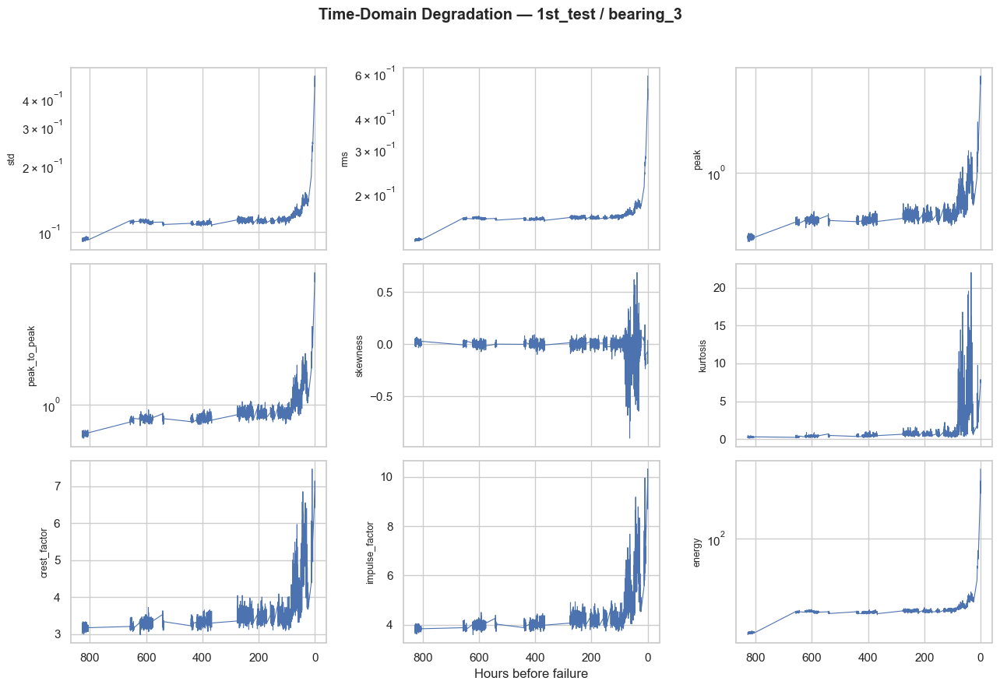

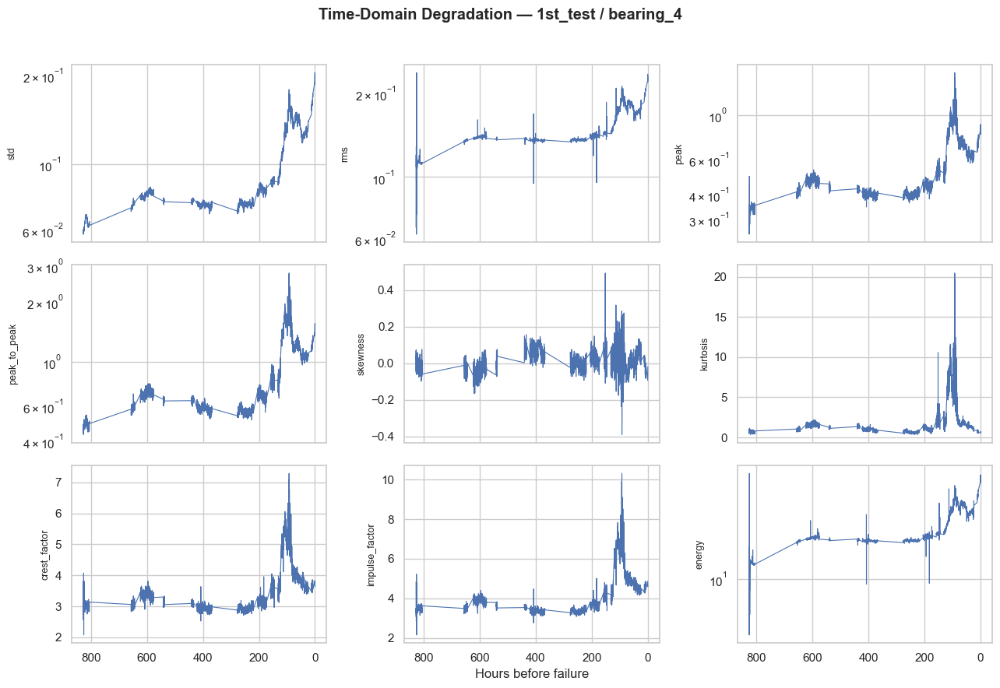

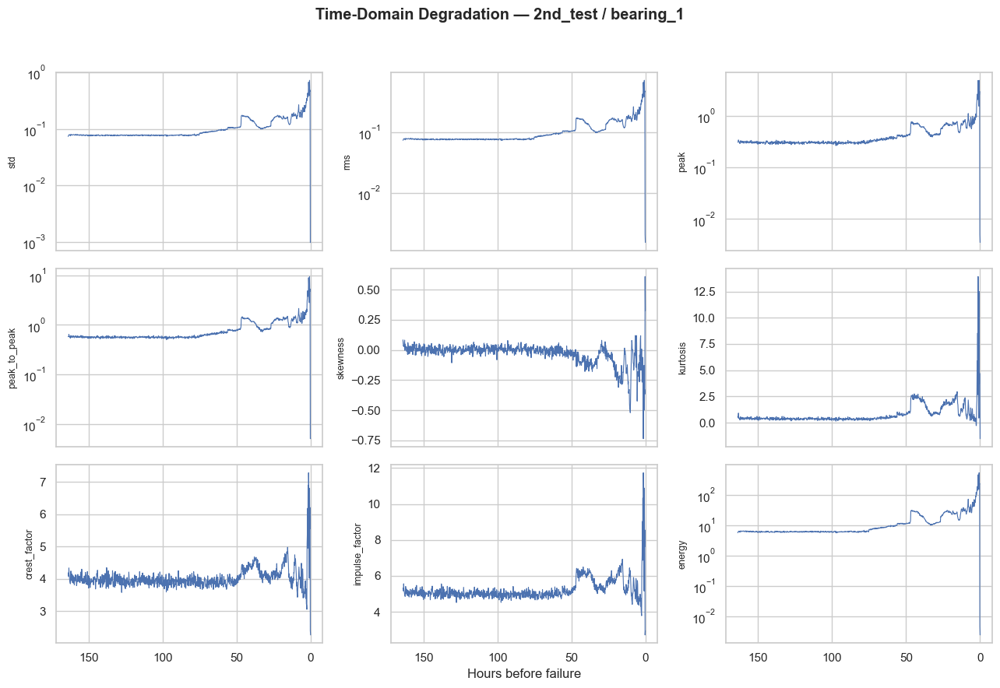

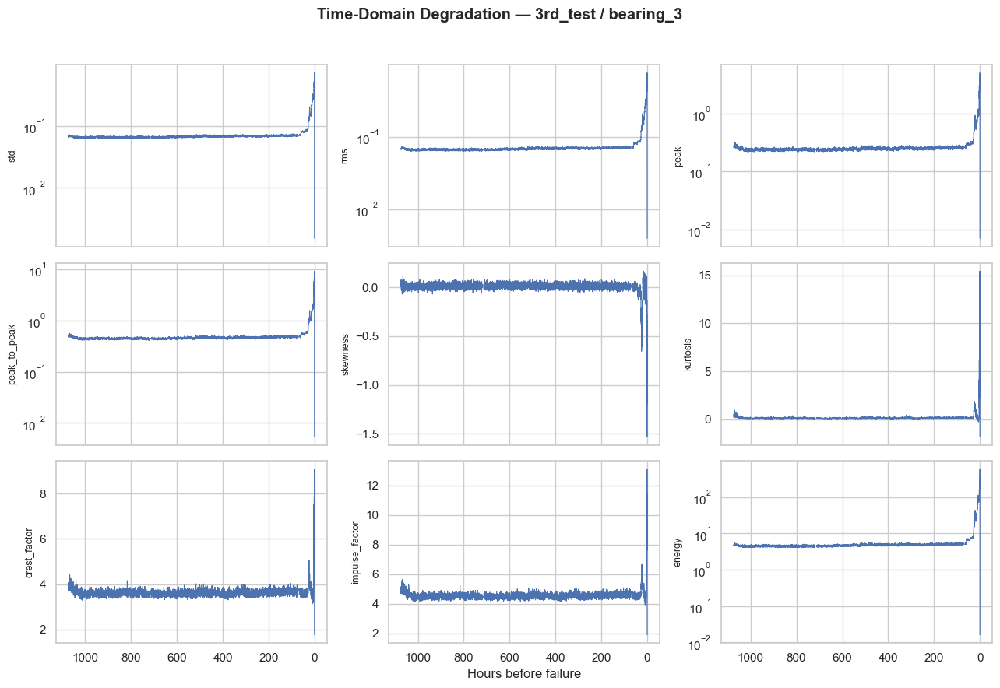

In [97]:
# ====================================================
# 24 — Extended Time-Domain Degradation Trends
# ====================================================

TIME_FEATURES_EXTENDED = [
    "std", "rms", "peak", "peak_to_peak",
    "skewness", "kurtosis", "crest_factor",
    "impulse_factor", "energy"
]
# variance (= std²), mean_absolute, shape_factor are near-duplicates of
# std / rms (your fig 07 heatmap) — omitted to keep the grid readable.

LOG_Y_FEATURES = {"std", "rms", "peak", "peak_to_peak", "energy"}

for group in FAILING_BEARING_GROUPS:
    test_name, bearing_name = group.test_set, group.bearing

    subset = features_df[
        (features_df["test_set"] == test_name) &
        (features_df["bearing"] == bearing_name)
    ]

    trend = (
        subset
        .groupby("RUL_hours")[TIME_FEATURES_EXTENDED]
        .mean()
        .reset_index()
        .sort_values("RUL_hours", ascending=False)
    )

    fig, axes = plt.subplots(3, 3, figsize=(13, 9), sharex=True)

    for ax, feature in zip(axes.flat, TIME_FEATURES_EXTENDED):
        ax.plot(trend["RUL_hours"], trend[feature], lw=0.8, color="#4C72B0")
        if feature in LOG_Y_FEATURES:
            ax.set_yscale("log")
        ax.set_ylabel(feature, fontsize=9)

    axes[0, 0].invert_xaxis()          # once only — shared axis lesson from fig 03
    fig.suptitle(f"Time-Domain Degradation — {test_name} / {bearing_name}",
                 fontweight="bold")
    axes[2, 1].set_xlabel("Hours before failure")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(FIGURES_DIR / f"24_time_trends_ext_{test_name}_{bearing_name}.png", dpi=120)
    plt.show()

### Feature Behavior Categories

* **Amplitude & Energy Metrics (`rms`, `std`, `peak`, `peak_to_peak`, `energy`)**
  * **Trend:** Maintain flat baselines during early life, followed by exponential, monotonic acceleration in the final $50\text{--}100\text{ hours}$ of operation.
  * **Diagnostic Utility:** Highly effective for late-stage degradation monitoring and defining $\text{RUL}$ alarm thresholds, as total vibration energy directly correlates with global metal spalling.
* **Impulsiveness Metrics (`kurtosis`, `crest_factor`, `impulse_factor`)**
  * **Trend:** Spike sharply during initial defect onset when localized micro-spalls generate high-amplitude, isolated shock impacts against a quiet noise floor.
  * **The "Spike-and-Drop" Effect:** Visible in `1st_test / bearing_4` and `2nd_test / bearing_1`, kurtosis spikes to extreme highs ($\sim 15\text{--}20$) near defect initiation, then drops back down near failure. As spalling spreads across the race, discrete impacts merge into continuous heavy vibration, driving up the baseline $\text{RMS}$ and lowering peak-to-average ratios.
* **Asymmetry Metric (`skewness`)**
  * **Trend:** Remains stable around zero during normal operations, fluctuating wildly into negative and positive territory only during terminal breakdown.
  * **Diagnostic Utility:** Serves as a secondary indicator of asymmetric signal clipping or directional impacts caused by severe mechanical instability.

---

### Comparative Takeaways Across Bearings

* **Early Alarm vs. Failure Threshold:** `kurtosis` and `crest_factor` trigger initial maintenance alerts early in the damage cycle, whereas `rms` and `energy` provide stable continuous tracking up to catastrophic failure without early saturation.
* **Log-Scale Necessity:** Using logarithmic scaling for energy and peak metrics prevents late-stage exponential surges from compressing early-stage baseline variations into flat lines.

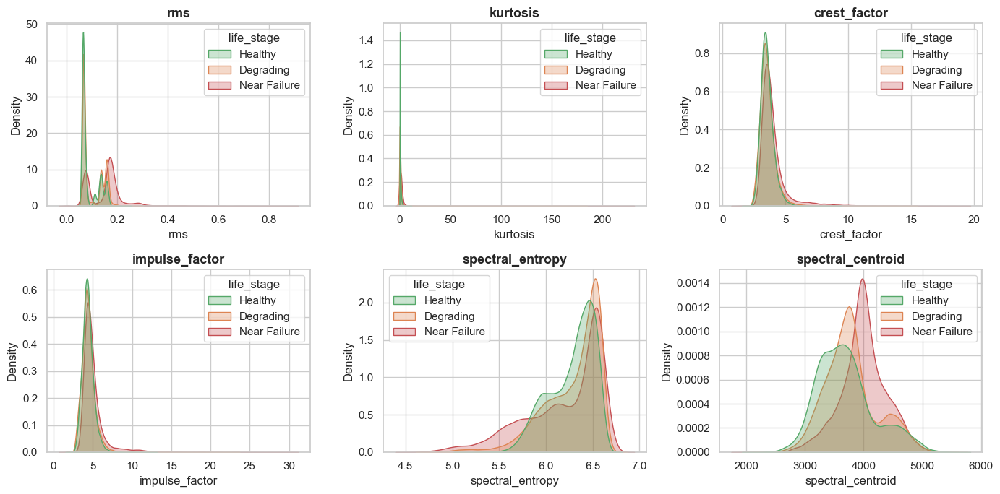

In [98]:
DIST_FEATURES_EXTENDED = [
    "rms", "kurtosis", "crest_factor", "impulse_factor",
    "spectral_entropy", "spectral_centroid"
]

palette = {"Healthy": "#55A868", "Degrading": "#DD8452", "Near Failure": "#C44E52"}

fig, axes = plt.subplots(2, 3, figsize=(14, 7))
for ax, feature in zip(axes.flat, DIST_FEATURES_EXTENDED):
    sns.kdeplot(
        data=features_df, x=feature, hue="life_stage",
        hue_order=["Healthy", "Degrading", "Near Failure"],
        palette=palette, fill=True, alpha=0.3, common_norm=False, ax=ax
    )
    ax.set_title(feature)
plt.tight_layout()
plt.savefig(FIGURES_DIR / "24b_distributions_extended.png", dpi=120)
plt.show()

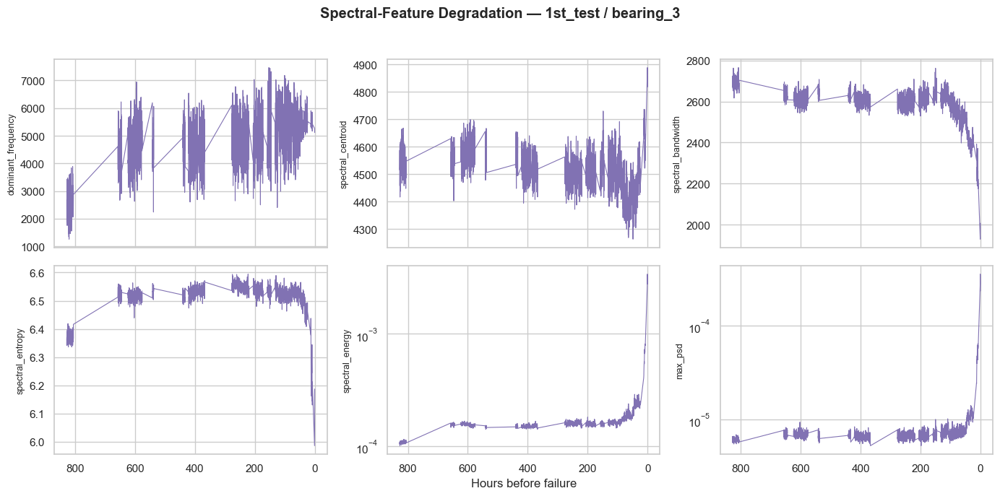

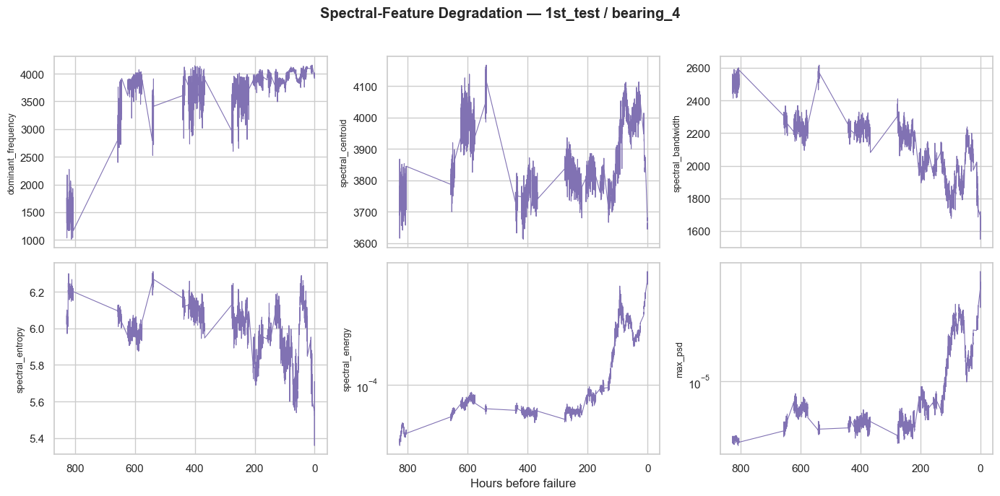

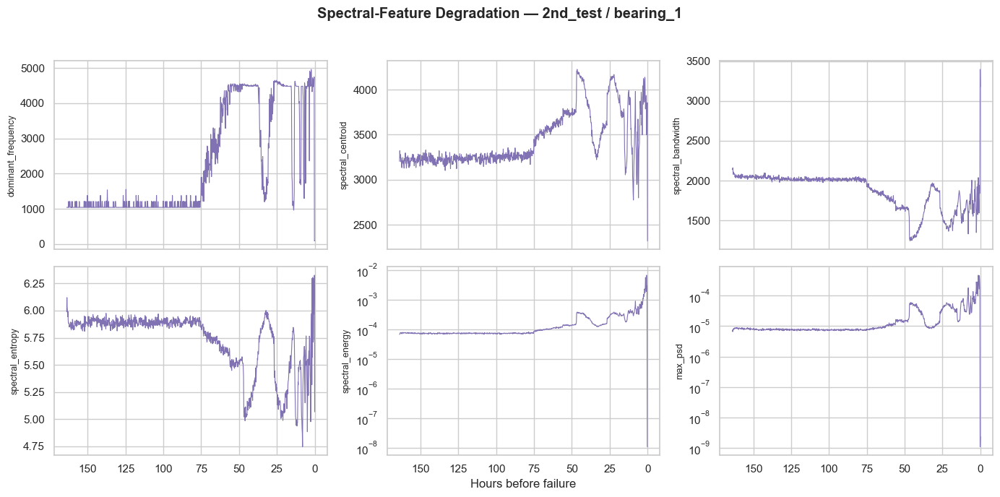

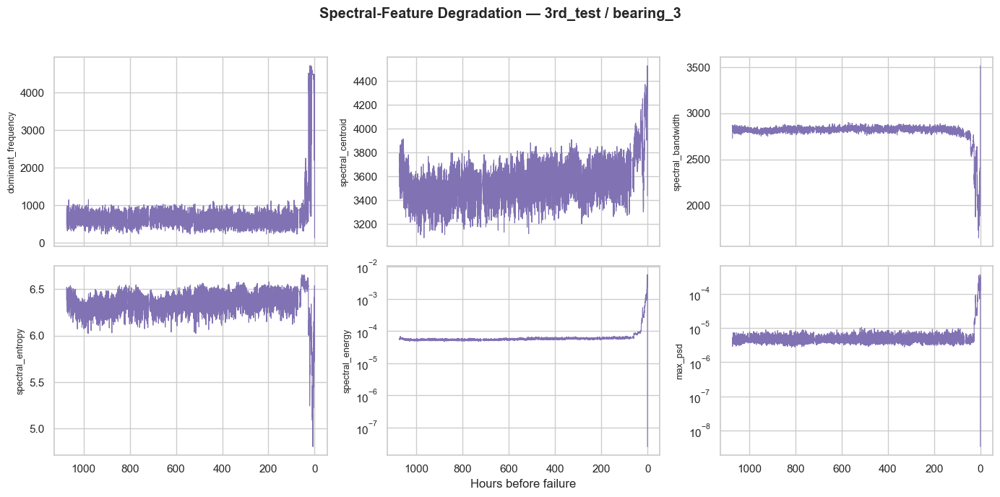

In [99]:
# ====================================================
# 25 — Extended Spectral-Feature Degradation Trends
# ====================================================

FREQ_FEATURES_EXTENDED = [
    "dominant_frequency", "spectral_centroid", "spectral_bandwidth",
    "spectral_entropy", "spectral_energy", "max_psd"
]

LOG_Y_FREQ = {"spectral_energy", "max_psd"}

for group in FAILING_BEARING_GROUPS:
    test_name, bearing_name = group.test_set, group.bearing

    subset = features_df[
        (features_df["test_set"] == test_name) &
        (features_df["bearing"] == bearing_name)
    ]

    trend = (
        subset
        .groupby("RUL_hours")[FREQ_FEATURES_EXTENDED]
        .mean()
        .reset_index()
        .sort_values("RUL_hours", ascending=False)
    )

    fig, axes = plt.subplots(2, 3, figsize=(14, 7), sharex=True)

    for ax, feature in zip(axes.flat, FREQ_FEATURES_EXTENDED):
        ax.plot(trend["RUL_hours"], trend[feature], lw=0.8, color="#8172B3")
        if feature in LOG_Y_FREQ:
            ax.set_yscale("log")
        ax.set_ylabel(feature, fontsize=9)

    axes[0, 0].invert_xaxis()
    fig.suptitle(f"Spectral-Feature Degradation — {test_name} / {bearing_name}",
                 fontweight="bold")
    axes[1, 1].set_xlabel("Hours before failure")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(FIGURES_DIR / f"25_freq_trends_ext_{test_name}_{bearing_name}.png", dpi=120)
    plt.show()

### Frequency-Domain Feature Dynamics

* **Energy & Amplitude Metrics (`spectral_energy`, `max_psd`):**
  * **Monotonic Late-Stage Acceleration:** Exhibit flat baseline behavior during early healthy operation, followed by exponential growth in the final $50\text{--}100\text{ hours}$ of life.
  * **Diagnostic Utility:** Directly mirror total vibration energy, serving as reliable indicators of damage severity near end-of-life across all test sets.
* **Spectral Distribution Metrics (`spectral_centroid`, `dominant_frequency`):**
  * **High-Frequency Shift:** As surface micro-cracking and spalling initiate, energy shifts upward from rotational speeds toward high-frequency structural resonances ($3.5\text{--}4.5\text{ kHz}$).
  * **Diagnostic Utility:** Provide early warnings of defect initiation prior to large increases in total vibration power.
* **Spectral Shape Metrics (`spectral_bandwidth`, `spectral_entropy`):**
  * **Late-Stage Concentration (Drop Off):** Both features decrease sharply as catastrophic failure approaches.
  * **Physical Mechanism:** Early damage introduces broadband impact noise (high entropy and wide bandwidth). As the defect expands into a continuous, high-amplitude fault tone, energy concentrates into dominant harmonic peaks, collapsing spectral entropy and narrowing the bandwidth.

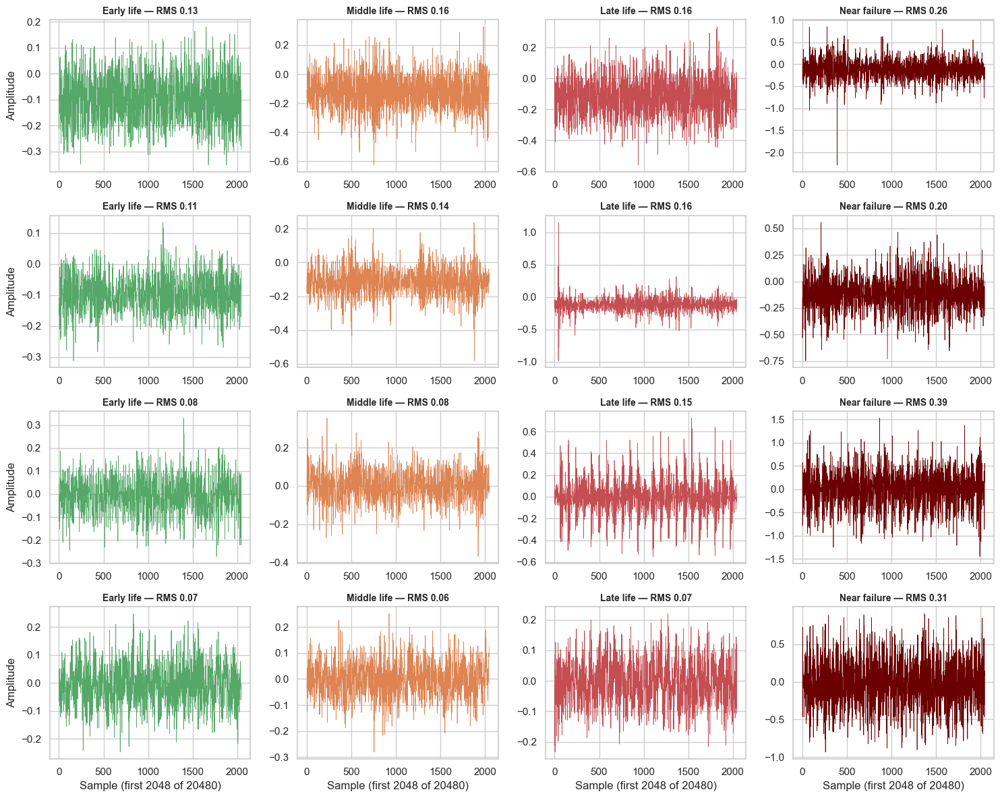

In [100]:
# ====================================================
# 26 — Raw Waveform Evolution Across Life
# ====================================================

STAGE_FRACTIONS = {
    "Early life": 0.02, "Middle life": 0.35,
    "Late life": 0.75, "Near failure": 0.995
}
STAGE_COLORS = {
    "Early life": "#55A868", "Middle life": "#DD8452",
    "Late life": "#C44E52", "Near failure": "#6B0000"
}

n_groups = len(FAILING_BEARING_GROUPS)
fig, axes = plt.subplots(n_groups, 4, figsize=(15, 3.0 * n_groups))
if n_groups == 1:
    axes = axes.reshape(1, -1)

for row, group in enumerate(FAILING_BEARING_GROUPS):
    test_name, bearing_name = group.test_set, group.bearing
    files = sorted(get_recording_files(DATASET_PATH / test_name), key=parse_timestamp)
    n = len(files)

    for col, (stage, frac) in enumerate(STAGE_FRACTIONS.items()):
        idx = min(int(frac * (n - 1)), n - 1)
        signal = np.nan_to_num(
            load_waveform(test_name, bearing_name, files[idx]).astype(float)
        )

        axes[row, col].plot(signal[:2048], lw=0.5, color=STAGE_COLORS[stage])
        rms = np.sqrt(np.mean(signal ** 2))
        axes[row, col].set_title(f"{stage} — RMS {rms:.2f}", fontsize=10)
        if col == 0:
            axes[row, col].set_ylabel("Amplitude")

for ax in axes[-1]:
    ax.set_xlabel("Sample (first 2048 of 20480)")

plt.tight_layout()
plt.savefig(FIGURES_DIR / "26_waveform_evolution.png", dpi=120)
plt.show()

This section samples and visualizes raw time-series vibration snapshots (first 2,048 samples) across four key lifecycle stages (Early life, Middle life, Late life, and Near failure) for each failing bearing.

### Key Waveform Morphological Observations

* **Early to Middle Life (Baseline Stability):** Signals exhibit stationary Gaussian noise characteristics with tight amplitude bounds ($\pm 0.1$ to $\pm 0.3$) and low Root Mean Square ($\text{RMS}$) values ($0.07$ to $0.16$).
* **Late Life (Transient Impact Emergence):** Periodic, high-amplitude impulse spikes begin emerging from the baseline noise floor. This corresponds to discrete roller impacts over early localized micro-spalls.
* **Near Failure (Severe Structural Breakdown):** The background noise floor shifts dramatically, accompanied by continuous high-energy transient spikes reaching peak amplitudes up to $\pm 2.0$ or higher, driving sharp increases in overall $\text{RMS}$ energy (up to $0.39$).

### Diagnostic Significance

Visualizing raw signals directly validates why static amplitude thresholds fail early in the lifecycle: transient impact spikes appear in late life long before overall $\text{RMS}$ values double or triple near failure.

CV (%) over first 30 recordings, sorted by trend SNR (worst first):


group,1st_test/bearing_3,1st_test/bearing_4,2nd_test/bearing_1,3rd_test/bearing_3,median_trend_snr
feature,,,,,
mean,0.7,37.1,67.6,49.5,1.10
spectral_centroid,1.0,1.4,1.5,3.3,5.75
skewness,92.5,621.9,139.9,205.6,6.35
crest_factor,2.1,12.3,3.1,3.6,6.35
impulse_factor,2.1,16.6,3.4,3.9,7.15
dominant_frequency,19.5,16.8,6.4,28.2,8.45
shape_factor,0.2,3.9,0.4,0.3,9.85
spectral_entropy,0.3,0.5,1.2,1.1,11.95
spectral_bandwidth,0.7,1.5,1.6,0.9,15.95


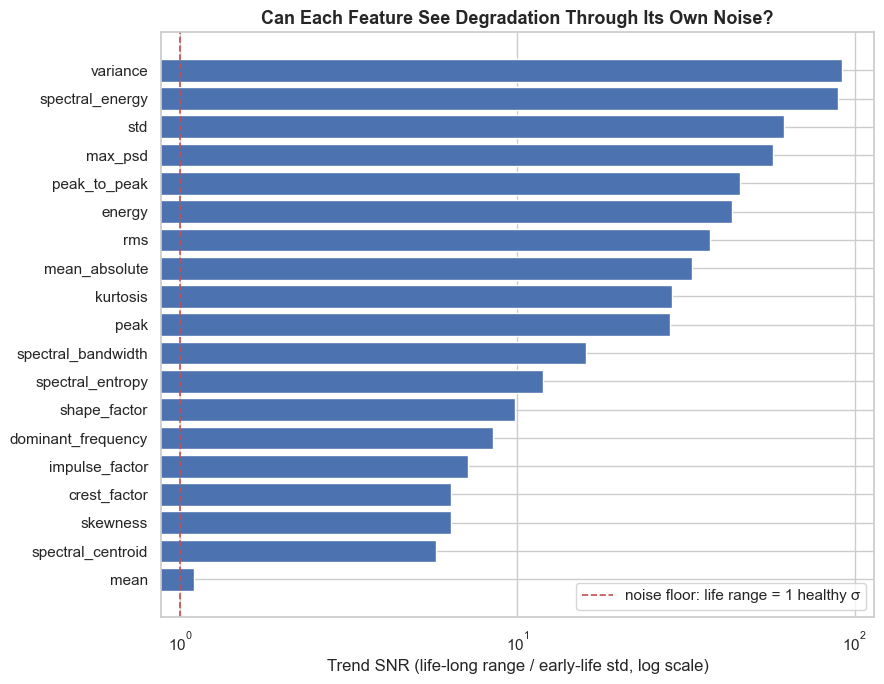

In [105]:
# ====================================================
# 31 — Feature Stability in Early Life
# ====================================================

stability_rows = []

for group in FAILING_BEARING_GROUPS:
    test_name, bearing_name = group.test_set, group.bearing

    sub = features_df[
        (features_df["test_set"] == test_name) &
        (features_df["bearing"] == bearing_name)
    ]

    # Per-recording means: window noise averaged out, so we measure
    # recording-to-recording fluctuation (the "healthy jitter").
    rec = sub.groupby("recording_index")[
        ["RUL_hours"] + NUMERIC_FEATURE_COLS
    ].mean()

    early = rec.head(BASELINE_RECORDINGS)

    for feat in NUMERIC_FEATURE_COLS:
        mean = early[feat].mean()
        sd = early[feat].std()
        cv = 100 * sd / abs(mean) if abs(mean) > 1e-9 else np.nan
        life_range = rec[feat].quantile(0.95) - rec[feat].quantile(0.05)
        trend_snr = life_range / (sd + 1e-12) if sd > 1e-12 else np.inf

        stability_rows.append({
            "feature": feat,
            "group": f"{test_name}/{bearing_name}",
            "cv_early_pct": round(cv, 1),
            "trend_snr": round(trend_snr, 1),
        })

stab = pd.DataFrame(stability_rows)

stab_table = stab.pivot(index="feature", columns="group", values="cv_early_pct")
stab_table["median_trend_snr"] = stab.groupby("feature")["trend_snr"].median()
stab_table = stab_table.sort_values("median_trend_snr")

print("CV (%) over first 30 recordings, sorted by trend SNR (worst first):")
display(stab_table)

# CV is meaningless when the mean is ~0 (mean, skewness) — trust trend_snr
# for those. Dominant_frequency has a "small" CV only because its mean is
# hundreds of Hz; its jitter is what matters, and trend_snr exposes it.

med_snr = stab.groupby("feature")["trend_snr"].median().sort_values()

fig, ax = plt.subplots(figsize=(9, 7))
ax.barh(med_snr.index, med_snr.values, color="#4C72B0")
ax.set_xscale("log")
ax.axvline(1.0, color="#C44E52", ls="--", lw=1.2,
           label="noise floor: life range = 1 healthy σ")
ax.set_xlabel("Trend SNR (life-long range / early-life std, log scale)")
ax.set_title("Can Each Feature See Degradation Through Its Own Noise?")
ax.legend()
plt.tight_layout()
plt.savefig(FIGURES_DIR / "31_feature_stability.png", dpi=120)
plt.show()

# ==========================================

In [ ]:
# ====================================================
# Convert filename into timestamp
# ====================================================

def parse_timestamp(file_path):
    return pd.to_datetime(
        file_path.name,
        format="%Y.%m.%d.%H.%M.%S",
        errors="coerce"
    )


print(parse_timestamp(sample_file))

2003-10-22 12:06:24


In [ ]:
def create_windows(signal, window_size=1024):
    """
    Split a signal into non-overlapping windows.

    Parameters
    ----------
    signal : array-like
        Raw vibration signal.

    window_size : int
        Number of samples in each window.

    Returns
    -------
    windows : ndarray
        Shape = (number_of_windows, window_size)
    """
    
    signal = np.asarray(signal)
    
    n_windows = len(signal) // window_size
    
    trimmed_length = n_windows * window_size
    
    trimmed_signal = signal[:trimmed_length]
    
    windows = trimmed_signal.reshape(
        n_windows,
        window_size
    )
    
    return windows

In [ ]:
signal = sample.iloc[:, CHANNEL_MAP["1st_test"]["bearing_3"]].values

windows = create_windows(
    signal,
    window_size=1024
)

print("Original samples :", len(signal))
print("Window shape     :", windows.shape)
print("Number of windows:", len(windows))

Original samples : 20480
Window shape     : (20, 1024)
Number of windows: 20


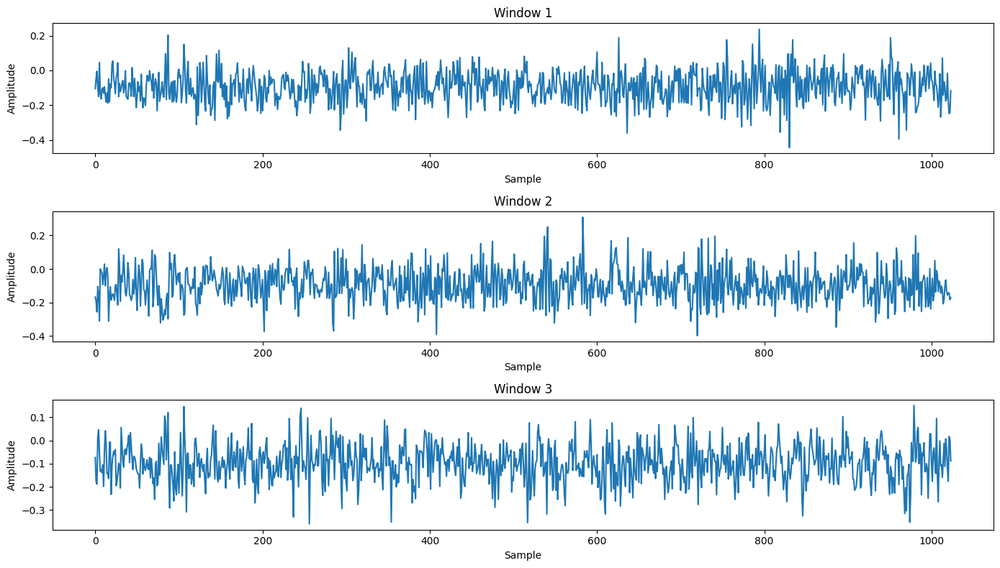

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(14, 8))

for i, ax in enumerate(axes):
    ax.plot(windows[i])
    ax.set_title(f"Window {i + 1}")
    ax.set_xlabel("Sample")
    ax.set_ylabel("Amplitude")

plt.tight_layout()
plt.show()

In [ ]:
def extract_time_features(x):
    """
    Extract time-domain features from one vibration window.
    """
    
    x = np.asarray(x)
    
    abs_x = np.abs(x)
    
    rms = np.sqrt(np.mean(x ** 2))
    
    peak = np.max(abs_x)
    
    mean_abs = np.mean(abs_x)
    
    features = {
        "mean": np.mean(x),
        "std": np.std(x),
        "variance": np.var(x),
        "rms": rms,
        "peak": peak,
        "peak_to_peak": np.ptp(x),
        "skewness": skew(x),
        "kurtosis": kurtosis(x),
        "crest_factor": peak / rms if rms != 0 else 0,
        "shape_factor": rms / mean_abs if mean_abs != 0 else 0,
        "impulse_factor": peak / mean_abs if mean_abs != 0 else 0,
        "energy": np.sum(x ** 2),
        "mean_absolute": mean_abs
    }
    
    return features

In [ ]:
def extract_frequency_features(x, fs=20480):
    """
    Extract frequency-domain features using Welch PSD.

    fs = sampling frequency in Hz.
    """
    
    frequencies, psd = welch(
        x,
        fs=fs,
        nperseg=min(256, len(x))
    )
    
    psd_sum = np.sum(psd)
    
    if psd_sum == 0:
        psd_sum = 1e-12
    
    dominant_frequency = frequencies[np.argmax(psd)]
    
    spectral_centroid = (
        np.sum(frequencies * psd) / psd_sum
    )
    
    spectral_bandwidth = np.sqrt(
        np.sum(
            ((frequencies - spectral_centroid) ** 2) * psd
        ) / psd_sum
    )
    
    normalized_psd = psd / psd_sum
    
    spectral_entropy = -np.sum(
        normalized_psd *
        np.log2(normalized_psd + 1e-12)
    )
    
    spectral_energy = np.sum(psd)
    
    return {
        "dominant_frequency": dominant_frequency,
        "spectral_centroid": spectral_centroid,
        "spectral_bandwidth": spectral_bandwidth,
        "spectral_entropy": spectral_entropy,
        "spectral_energy": spectral_energy,
        "max_psd": np.max(psd)
    }

In [ ]:
def extract_features(window, fs=20480):
    """
    Extract all time and frequency-domain features.
    """
    
    time_features = extract_time_features(window)
    
    frequency_features = extract_frequency_features(
        window,
        fs=fs
    )
    
    return {
        **time_features,
        **frequency_features
    }

In [ ]:
WINDOW_SIZE = 1024
SAMPLING_FREQUENCY = 20480

all_rows = []

for test_name, failed_bearings in FAILED_BEARINGS.items():
    
    test_path = DATASET_PATH / test_name
    
    recording_files = get_recording_files(test_path)
    
    recording_files = sorted(
        recording_files,
        key=parse_timestamp
    )
    
    print(f"\nProcessing {test_name}...")
    print(f"Total recordings: {len(recording_files)}")
    
    for recording_index, file_path in enumerate(recording_files):
        
        timestamp = parse_timestamp(file_path)
        
        data = pd.read_csv(
            file_path,
            sep=r"\s+",
            header=None,
            engine="python"
        )
        
        for bearing_name in failed_bearings:
            
            channel_index = CHANNEL_MAP[test_name][bearing_name]
            
            signal = data.iloc[:, channel_index].values
            
            windows = create_windows(
                signal,
                window_size=WINDOW_SIZE
            )
            
            for window_index, window in enumerate(windows):
                
                feature_row = extract_features(
                    window,
                    fs=SAMPLING_FREQUENCY
                )
                
                feature_row["test_set"] = test_name
                feature_row["bearing"] = bearing_name
                feature_row["recording_index"] = recording_index
                feature_row["window_index"] = window_index
                feature_row["timestamp"] = timestamp
                
                all_rows.append(feature_row)
    
    print(f"Finished {test_name}")

features_df = pd.DataFrame(all_rows)

print("\nFinal shape:", features_df.shape)


Processing 1st_test...
Total recordings: 2156
Finished 1st_test

Processing 2nd_test...
Total recordings: 984
Finished 2nd_test

Processing 3rd_test...
Total recordings: 6324
Finished 3rd_test

Final shape: (232400, 24)


In [ ]:
features = extract_features(windows[0])

pd.DataFrame([features])

,mean,std,variance,rms,peak,peak_to_peak,skewness,kurtosis,crest_factor,shape_factor,impulse_factor,energy,mean_absolute,dominant_frequency,spectral_centroid,spectral_bandwidth,spectral_entropy,spectral_energy,max_psd
0,0.003452,0.001522,0.000002,0.003773,0.007,0.005,0.131693,-1.860826,1.855426,1.092861,2.027723,0.014575,0.003452,160.0,3499.675103,3541.730233,5.717749,2.633541e-08,3.633082e-09


In [ ]:
features_df = features_df.sort_values(
    by=[
        "test_set",
        "bearing",
        "timestamp",
        "window_index"
    ]
).reset_index(drop=True)

features_df.head()

,mean,std,variance,rms,peak,peak_to_peak,skewness,kurtosis,crest_factor,shape_factor,...,spectral_centroid,spectral_bandwidth,spectral_entropy,spectral_energy,max_psd,test_set,bearing,recording_index,window_index,timestamp
0,-0.092337,0.089429,0.007997,0.128544,0.444,0.681,-0.034094,0.300560,3.454068,1.221242,...,4692.528749,2578.613850,6.336685,0.000102,0.000006,1st_test,bearing_3,0,0,2003-10-22 12:06:24
1,-0.093666,0.099392,0.009879,0.136573,0.398,0.706,0.200843,0.248454,2.914201,1.208043,...,4623.970771,2775.059659,6.370781,0.000122,0.000007,1st_test,bearing_3,0,1,2003-10-22 12:06:24
2,-0.096662,0.080187,0.006430,0.125593,0.359,0.510,-0.101341,0.290571,2.858441,1.189838,...,4132.866720,2660.288748,6.412999,0.000080,0.000005,1st_test,bearing_3,0,2,2003-10-22 12:06:24
3,-0.096557,0.091579,0.008387,0.133078,0.432,0.647,-0.047599,0.126897,3.246208,1.217891,...,4073.166371,2610.632796,6.351947,0.000099,0.000009,1st_test,bearing_3,0,3,2003-10-22 12:06:24
4,-0.087128,0.099850,0.009970,0.132519,0.452,0.782,0.151351,0.683224,3.410828,1.220836,...,4893.917207,2736.680907,6.292802,0.000130,0.000007,1st_test,bearing_3,0,4,2003-10-22 12:06:24


In [ ]:
features_df["failure_timestamp"] = (
    features_df
    .groupby(["test_set", "bearing"])["timestamp"]
    .transform("max")
)

features_df["RUL_minutes"] = (
    features_df["failure_timestamp"] - features_df["timestamp"]
).dt.total_seconds() / 60

features_df["RUL_hours"] = (
    features_df["RUL_minutes"] / 60
)

features_df[
    [
        "test_set",
        "bearing",
        "timestamp",
        "RUL_hours"
    ]
].head()

,test_set,bearing,timestamp,RUL_hours
0,1st_test,bearing_3,2003-10-22 12:06:24,827.558889
1,1st_test,bearing_3,2003-10-22 12:06:24,827.558889
2,1st_test,bearing_3,2003-10-22 12:06:24,827.558889
3,1st_test,bearing_3,2003-10-22 12:06:24,827.558889
4,1st_test,bearing_3,2003-10-22 12:06:24,827.558889


In [ ]:
features_df["RUL_fraction"] = (
    features_df["RUL_hours"] /
    features_df.groupby(["test_set", "bearing"])["RUL_hours"]
    .transform("max")
)

features_df["RUL_fraction"] = features_df["RUL_fraction"].clip(0, 1)  

In [ ]:
features_df["health_index"] = (
    features_df["RUL_fraction"] * 100
)

features_df[
    [
        "timestamp",
        "RUL_hours",
        "health_index"
    ]
].head()

,timestamp,RUL_hours,health_index
0,2003-10-22 12:06:24,827.558889,100.0
1,2003-10-22 12:06:24,827.558889,100.0
2,2003-10-22 12:06:24,827.558889,100.0
3,2003-10-22 12:06:24,827.558889,100.0
4,2003-10-22 12:06:24,827.558889,100.0


In [ ]:
features_df["failure_risk_score"] = (
    100 - features_df["health_index"]
)

features_df["failure_risk_score"] = (
    features_df["failure_risk_score"].clip(0, 100)
)


In [ ]:
OUTPUT_PATH = Path("ims_features_dataset.csv")

features_df.to_csv(
    OUTPUT_PATH,
    index=False
)

print("Dataset saved to:")
print(OUTPUT_PATH.resolve())

Dataset saved to:
C:\Users\Abdelrahman Mahmoud\OneDrive\Desktop\predective maintanance\ims_features_dataset.csv


In [ ]:
df=pd.read_csv("ims_features_dataset.csv")
df.shape
df.duplicated().sum()

np.int64(0)

In [ ]:
# ====================================================
# Visualization Setup
# ====================================================
import seaborn as sns

sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams["figure.dpi"] = 100
plt.rcParams["axes.titlesize"] = 13
plt.rcParams["axes.titleweight"] = "bold"

FIGURES_DIR = Path("figures")
FIGURES_DIR.mkdir(exist_ok=True)

FAILING_BEARING_GROUPS = list(
    features_df[["test_set", "bearing"]]
    .drop_duplicates()
    .sort_values(["test_set", "bearing"])
    .itertuples(index=False)
)- -

print("Bearing groups in dataset:")
for group in FAILING_BEARING_GROUPS:
    print(" -", group.test_set, "/", group.bearing)

Bearing groups in dataset:
 - 1st_test / bearing_3
 - 1st_test / bearing_4
 - 2nd_test / bearing_1
 - 3rd_test / bearing_3


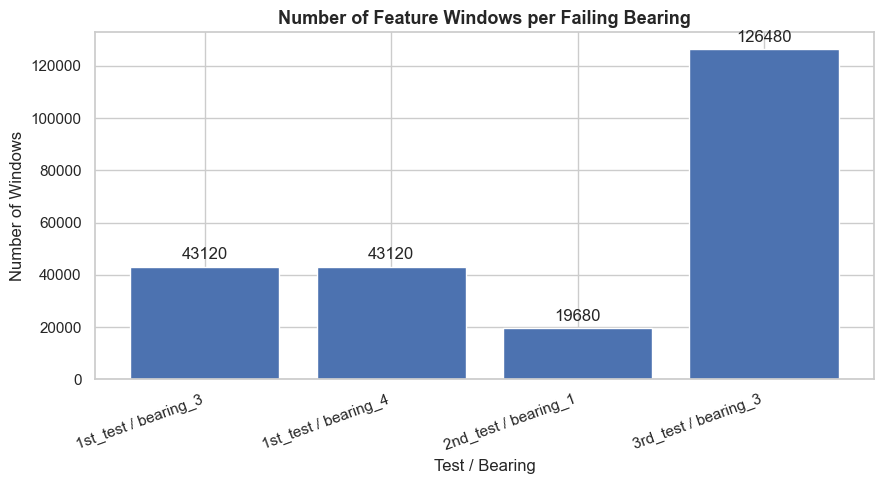

In [ ]:
# ====================================================
# Windows per Bearing/Test
# ====================================================
window_counts = (
    features_df
    .groupby(["test_set", "bearing"])
    .size()
    .reset_index(name="n_windows")
)
window_counts["label"] = window_counts["test_set"] + " / " + window_counts["bearing"]

fig, ax = plt.subplots(figsize=(9, 5))
bars = ax.bar(window_counts["label"], window_counts["n_windows"], color="#4C72B0")
ax.bar_label(bars, padding=3)
ax.set_title("Number of Feature Windows per Failing Bearing")
ax.set_xlabel("Test / Bearing")
ax.set_ylabel("Number of Windows")
plt.xticks(rotation=20, ha="right")
plt.tight_layout()
plt.savefig(FIGURES_DIR / "01_windows_per_bearing.png")
plt.show()

### Type 1 — Wears out slowly (1st_test bearings)
Think of it like a tire wearing down evenly. The whole surface gets rougher over time. So the signal just gets noisier and noisier everywhere, all the time.

Type 2 — Has one damaged spot (2nd_test / 3rd_test bearings)
Think of it like a tiny crack in one spot on a spinning wheel. Most of the time it's smooth. But every time that one damaged spot rotates past, it gives a little "thump." So the signal is quiet... quiet... quiet... spike... quiet... quiet... spike.

That's why they look different. Different damage = different shape.

### The one non-obvious thing to mention (this impresses in a presentation):
### Kurtosis sometimes drops back down even as the bearing gets worse (you can see this in bearing_3 — busy for a while, then flat again before the end). That's not the bearing healing. It's that once the defect is big enough, impacts overlap and blend into continuous noise — statistically it starts looking "smooth" again even though it's more damaged. RMS keeps rising because energy never stops increasing; kurtosis just changes character.

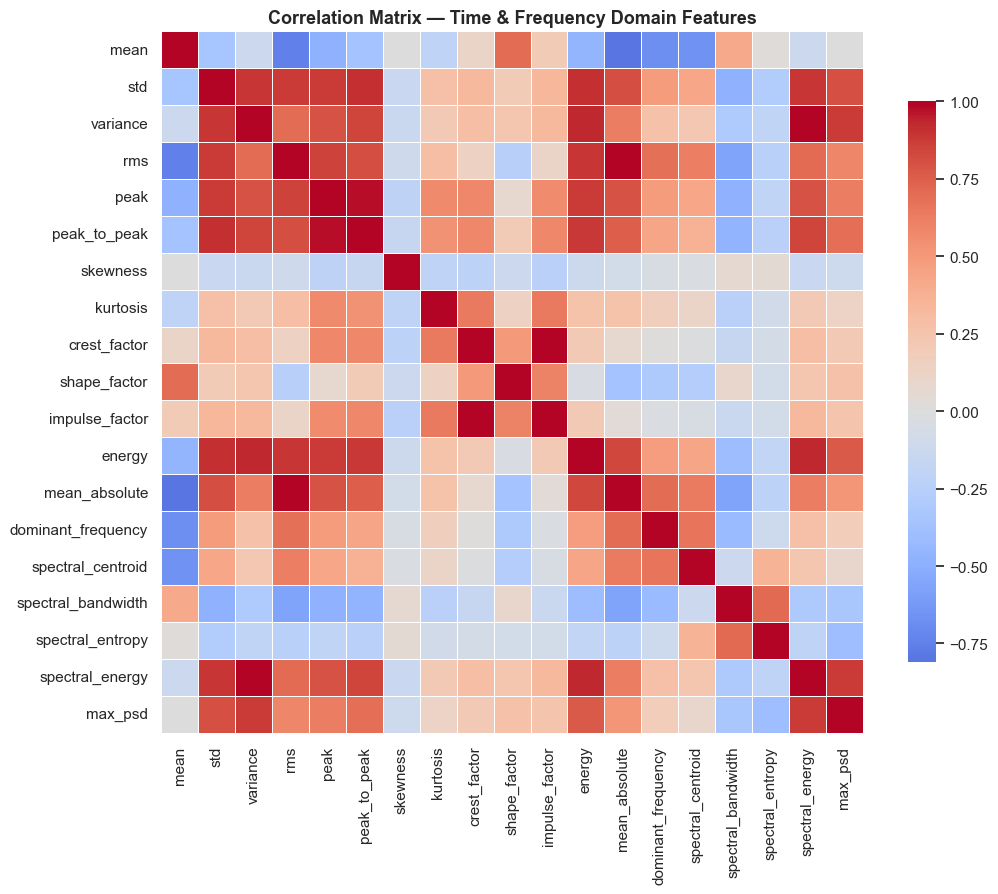

In [ ]:
# ====================================================
# Correlation Matrix — Time & Frequency Domain Features
# ====================================================
NUMERIC_FEATURE_COLS = [
    "mean", "std", "variance", "rms", "peak", "peak_to_peak",
    "skewness", "kurtosis", "crest_factor", "shape_factor",
    "impulse_factor", "energy", "mean_absolute",
    "dominant_frequency", "spectral_centroid", "spectral_bandwidth",
    "spectral_entropy", "spectral_energy", "max_psd"
]

corr_matrix = features_df[NUMERIC_FEATURE_COLS].corr()

fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(
    corr_matrix,
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.4,
    cbar_kws={"shrink": 0.8},
    ax=ax
)
ax.set_title("Correlation Matrix — Time & Frequency Domain Features")
plt.tight_layout()
plt.savefig(FIGURES_DIR / "07_feature_correlation_heatmap.png")
plt.show()

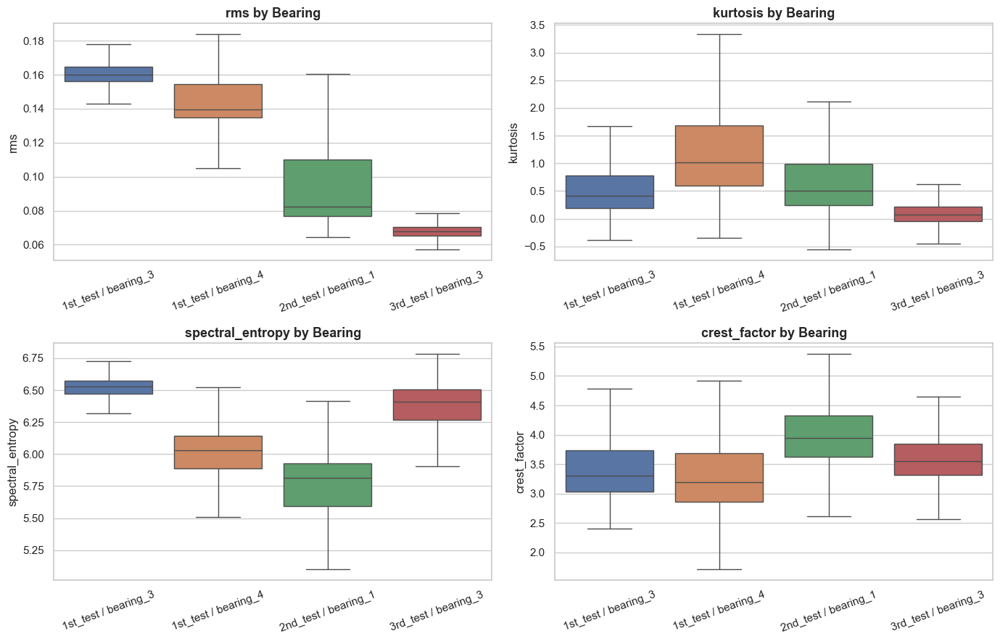

In [ ]:
# ====================================================
# Feature Spread by Bearing
# ====================================================
features_df["group"] = features_df["test_set"] + " / " + features_df["bearing"]

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
axes = axes.flatten()

for ax, feature in zip(axes, DIST_FEATURES):
    sns.boxplot(
        data=features_df,
        x="group",
        y=feature,
        hue="group",
        palette="deep",
        legend=False,
        showfliers=False,
        ax=ax
    )
    ax.set_title(f"{feature} by Bearing")
    ax.set_xlabel("")
    ax.tick_params(axis="x", rotation=20)

plt.tight_layout()
plt.savefig(FIGURES_DIR / "08_feature_boxplots_by_bearing.png")
plt.show()

In [ ]:
# ====================================================
# Summary Statistics Table
# ====================================================
summary_stats = (
    features_df
    .groupby(["test_set", "bearing"])[NUMERIC_FEATURE_COLS]
    .agg(["mean", "std", "min", "max"])
)
summary_stats

mean                                     std  \
                        mean       std       min       max      mean   
test_set bearing                                                       
1st_test bearing_3 -0.112761  0.010216 -0.243764  0.537065  0.115125   
         bearing_4 -0.112849  0.008290 -0.234787  0.017646  0.091390   
2nd_test bearing_1 -0.001943  0.002810 -0.037029  0.027100  0.105967   
3rd_test bearing_3 -0.002073  0.003780 -0.360870  0.411486  0.072243   

                                                  variance            ...  \
                         std       min       max      mean       std  ...   
test_set bearing                                                      ...   
1st_test bearing_3  0.024332  0.079160  0.778452  0.013846  0.012213  ...   
         bearing_4  0.029332  0.048812  0.265877  0.009212  0.006566  ...   
2nd_test bearing_1  0.058358  0.000879  0.765265  0.014634  0.030573  ...   
3rd_test bearing_3  0.030792  0.001490  0.854622  0.006167  0.014339  ...   

                   spectral_entropy           spectral_energy            \
                                min       max            mean       std   
test_set bearing                                                          
1st_test bearing_3         5.189735  6.738315        0.000173  0.000157   
         bearing_4         4.931278  6.594852        0.000115  0.000084   
2nd_test bearing_1         4.552171  6.620348        0.000181  0.000382   
3rd_test bearing_3         4.623731  6.782413        0.000076  0.000173   

                                             max_psd                          \
                             min       max      mean       std           min   
test_set bearing                                                               
1st_test bearing_3  7.640319e-05  0.008378  0.000008  0.000016  2.803596e-06   
         bearing_4  2.719083e-05  0.000950  0.000010  0.000010  1.456928e-06   
2nd_test bearing_1  8.931479e-09  0.007450  0.000020  0.000038  5.245115e-10   
3rd_test bearing_3  2.477484e-08  0.007881  0.000007  0.000021  2.950198e-09   

                              
                         max  
test_set bearing              
1st_test bearing_3  0.001218  
         bearing_4  0.000129  
2nd_test bearing_1  0.000705  
3rd_test bearing_3  0.000639  

[4 rows x 76 columns]